In [10]:
#	№    For copying
import os
import pandas as pd
import seaborn as sns
import geopandas as gpd
from random import randint
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from draw import Histogram, Piechart, Map, StackedBar
from helper import CountryHelper,JobHelper, SexHelper

models = ["ChatGPT","Claude","DeepSeek","Gemini"]
case_studies = ["Career Development","Family Health","Financial Literacy","Media Literacy"]

dfs = {
    case_study: {
        model:pd.read_csv(os.path.join("Case Studies",case_study,f'{model}.csv'))
        for model in models
    }
    for case_study in case_studies
}

# dfs = {}
# for case_study in case_studies:
#     these_dfs = {
#         model:pd.read_excel(
#             os.path.join("Case Studies",case_study,f"{case_study}.xlsx"),
#             sheet_name=model,
#             nrows=51, #Header (1) + Data (50)
#             header=[1,2] if case_study in ['Career Development','Family Health'] else [1]
#         )
#         for model in models
#     }
    
#     for df in these_dfs.values():
#         df.columns = [
#             ' '.join(map(str,[    
#                 item for item in [(col,),col][type(col) is tuple] #Ensure col is a tuple
#                 if 'unnamed' not in str(item).lower() #Remove unnamed columns
#             ])).strip()
#             for col in df.columns
#         ]
#         df['Batch'] = df['Batch'].ffill().astype(int)
        
#     these_dfs = {df_i:df.drop(columns=[''], errors='ignore') for df_i,df in these_dfs.items()}
#     dfs[case_study] = these_dfs

# for case_study in dfs:
#     for model_df in dfs[case_study]:
#         dfs[case_study][model_df].to_csv(os.path.join("Case Studies",case_study,f"{model_df}.csv"),index=False)


dataset = "Family Health"
data_folder = os.path.join('Case Studies', dataset, 'data')
for folder in ['student','educator']:
    if not os.path.exists(os.path.join(data_folder,folder)):
        os.makedirs(os.path.join(data_folder,folder))
    

chizu = Map(models)
piechart = Piechart(models)
stackedBar = StackedBar(models)
histogram = Histogram(models)

sexHelper = SexHelper()
countryHelper = CountryHelper()
jobHelper = JobHelper()


student_df = {
    model: df[[
            "Batch","№","Student Name","Student Sex",
            "Student Age","Student Race","Student Country of Origin",
            "Student Education", "Student Employment"
    ]].rename({
        'Student Country of Origin':'Student Country of Residence'
    },axis=1)
    for model,df in dfs[dataset].items()
}

educator_df = {
    model: df[[
            "Batch","№","Educator Name","Educator Sex",
            "Educator Age","Educator Race","Educator Country of Origin",
            "Educator Education",
    ]].rename({
        'Educator Country of Origin':'Educator Country of Residence'
    },axis=1)
    for model,df in dfs[dataset].items()
}

C:\Users\Gabriel_Freeze\AppData\Local\Temp\ipykernel_12568\1851274269.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(avg_age_male, shade=True, label='Male', color='blue')
C:\Users\Gabriel_Freeze\AppData\Local\Temp\ipykernel_12568\1851274269.py:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(avg_age_female, shade=True, label='Female', color='pink')


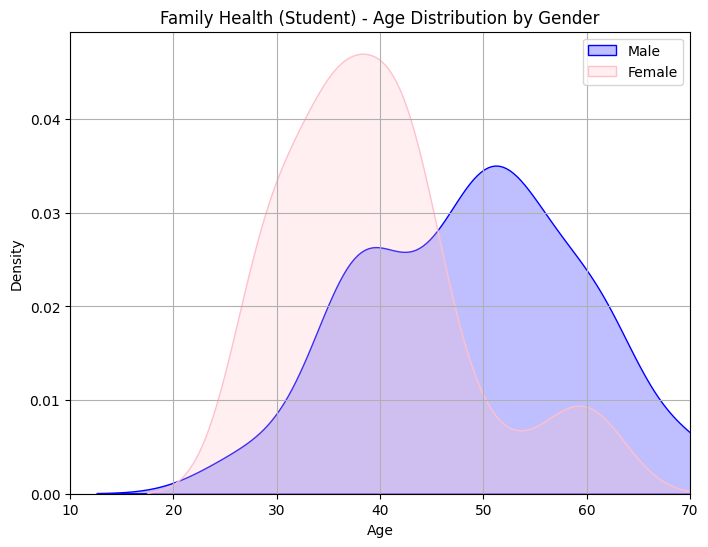

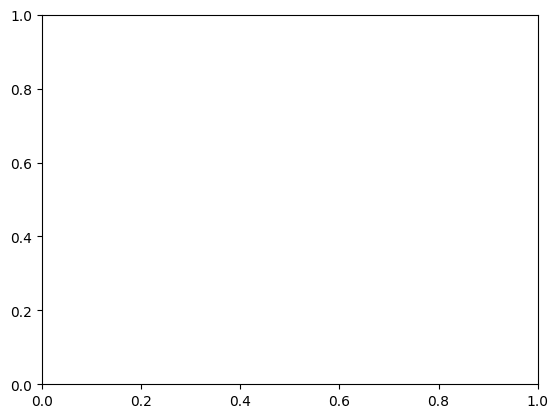

In [11]:
df = pd.concat([dfs[dataset][model].assign(model=model) for model in models], ignore_index=True)
df['Student Sex'] = df['Student Sex'].apply(sexHelper.sex2standard)
avg_age_male   = df[df['Student Sex'] == 'Male']  ['Student Age']  
avg_age_female = df[df['Student Sex'] == 'Female']['Student Age']

plt.figure(figsize=(8, 6))
sns.kdeplot(avg_age_male, shade=True, label='Male', color='blue')
sns.kdeplot(avg_age_female, shade=True, label='Female', color='pink')
plt.xlabel('Age')
plt.ylabel('Density')
plt.xlim(10, 70)
plt.grid(True)
plt.title(f'{dataset} (Student) - Age Distribution by Gender')
plt.legend()
plt.show()
plt.grid(False)


In [12]:
df['Student Sex'] = df['Student Sex'].apply(sexHelper.sex2standard)

mean_ages = df[df['Student Sex'].isin(['Male', 'Female'])].groupby(['model', 'Student Sex'])['Student Age'].mean().unstack()[['Male', 'Female']].apply(lambda x: round(x,0))
print(mean_ages)

Student Sex  Male  Female
model                    
ChatGPT      47.0    40.0
Claude       51.0    45.0
DeepSeek     44.0    37.0
Gemini       52.0    37.0


## Family Health (Student)

### Country of Origin by Race (Map)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


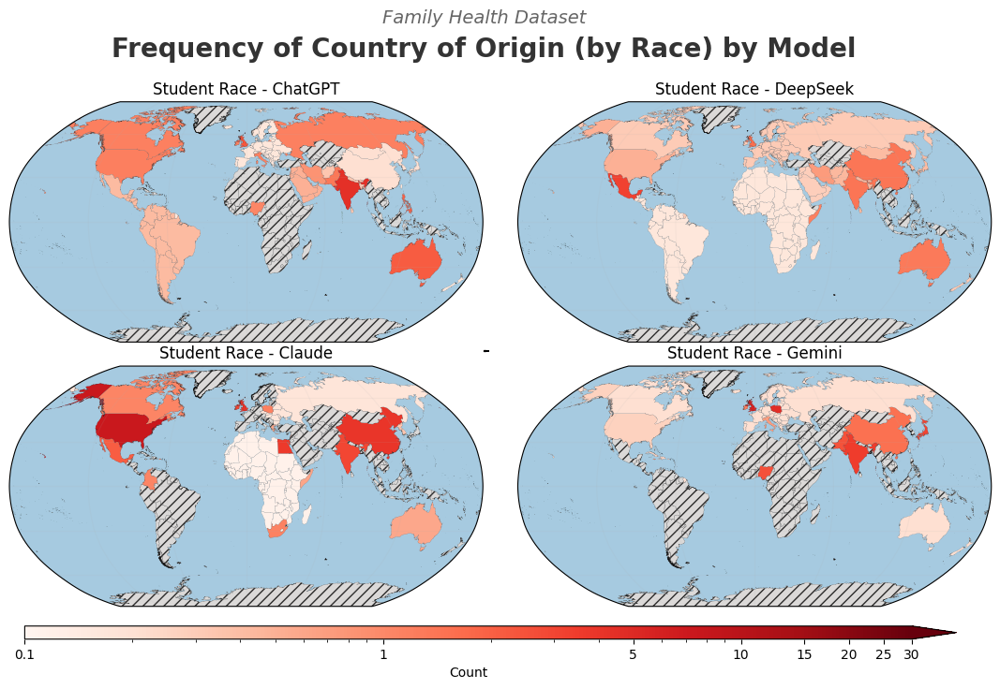

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


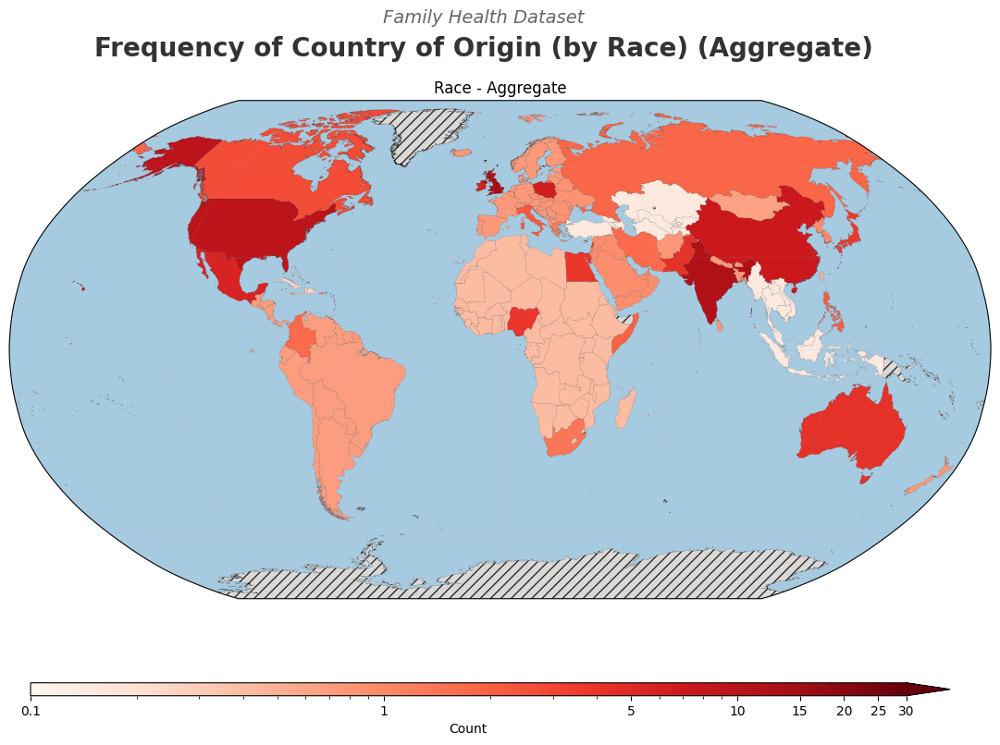

In [13]:
share_legend = True

fig, axs = plt.subplots(2, 2, figsize=(14, 7), squeeze=False,
                        subplot_kw={'projection': ccrs.Robinson()},
                        gridspec_kw={'wspace': 0, 'hspace': 0.1})

for i,model in enumerate(['ChatGPT','Claude','DeepSeek','Gemini']):

    df = student_df[model].copy()
    df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.fix_country_naming)
    df['Student Country of Origin'] = df['Student Race'].apply(countryHelper.race2country)
    
    axs[i%2][i//2] = chizu.draw(
        df=df,x='Student Country of Origin',
        title=f'Student Race - {model}',
        cmap='Reds', ax=axs[i%2][i//2],step=5,
        low_poly=False, log=True,
        max_count=30, legend=[0,0,share_legend,0][i],
    )
    
fig.suptitle('Frequency of Country of Origin (by Race) by Model', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country of Origin by Race (Map)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country of Origin by Race (Map).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country of Origin by Race (Map).eps"), format='eps', bbox_inches='tight')
plt.show()

df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)

df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.fix_country_naming)
df['Student Country of Origin'] = df['Student Race'].apply(countryHelper.race2country)

fig, ax = plt.subplots(figsize=(14, 7), subplot_kw={'projection': ccrs.Robinson()})
ax = chizu.draw(
    df=df,x='Student Country of Origin',
    title=f'Race - Aggregate',
    cmap='Reds', ax=ax, step=5,
    low_poly=False, log=True,
    max_count=30, legend=True,
    legend_loc=[0,-0.1,0,0]
)

fig.suptitle('Frequency of Country of Origin (by Race) (Aggregate)', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')

plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country of Origin by Race (Map) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country of Origin by Race (Map) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country of Origin by Race (Map) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Country of Origin by Race (Histogram)

Continent


c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:260: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:260: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:260: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:260: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:312: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect

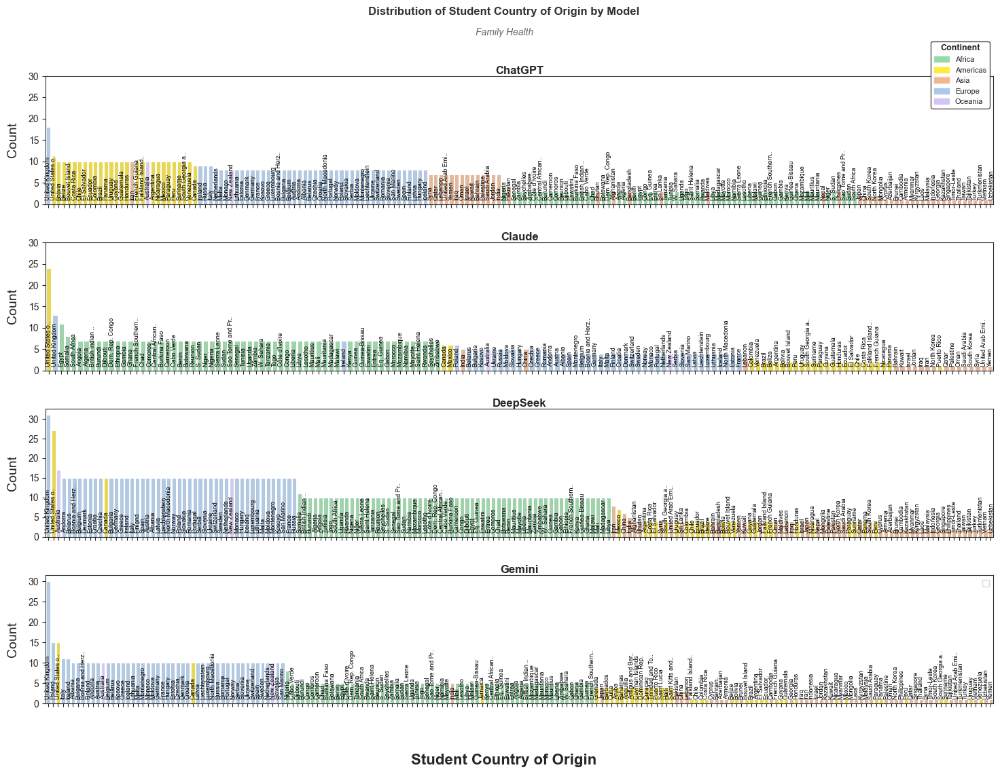

In [14]:
df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Country of Origin'] = df['Student Race']  \
    .apply(countryHelper.race2country) \
    .apply(countryHelper.fix_country_naming)

df = df[["Student Country of Origin",'model']]
df = df.explode('Student Country of Origin')
df['Region'] = df['Student Country of Origin'].apply(
    lambda country: countryHelper.country2region(country)['subregion']
)
df['Continent'] = df['Student Country of Origin'].apply(
    lambda country: countryHelper.country2region(country)['region']
)

#TODO: If hue is continet/region, use a map instead of a legend to show the colors
plt = histogram.draw(
    df=df,x='Student Country of Origin',
    hue='Continent',
    dataset=dataset, ylim=30,ystep=5,
    aggregate=False,long_layout=True,
    xtick_label_max_len=15,
    figsize=(18,12), legend=(1,1.3)
)
plt.legend(loc='upper right', fontsize='small') 
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country of Origin by Race (Histogram)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country of Origin by Race (Histogram).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country of Origin by Race (Histogram).eps"), format='eps', bbox_inches='tight')
plt.show()

### Gender Countries (Map)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


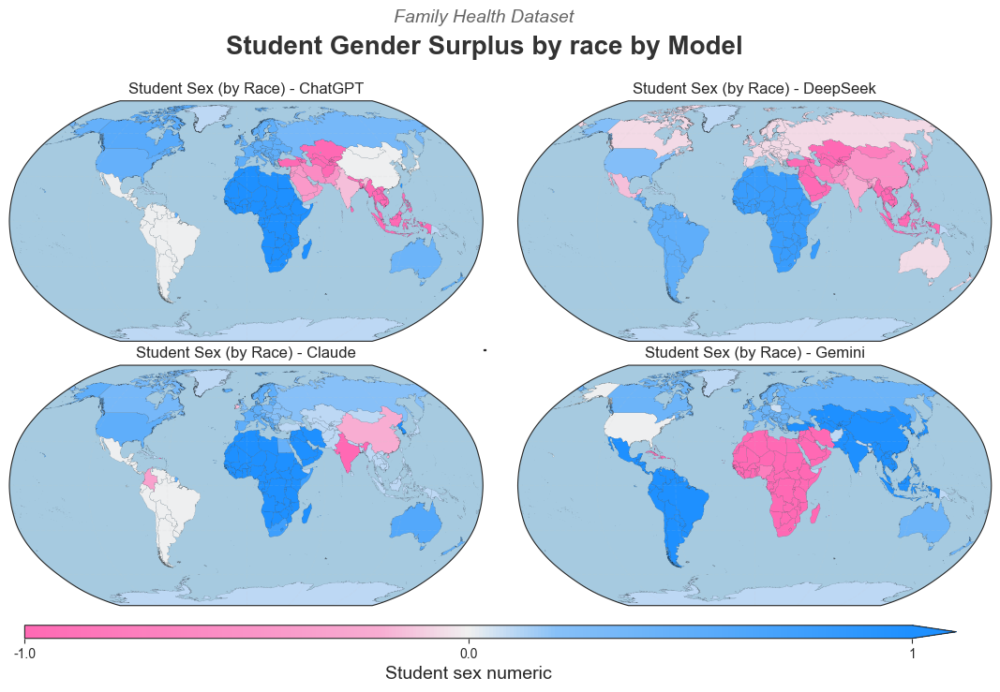

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


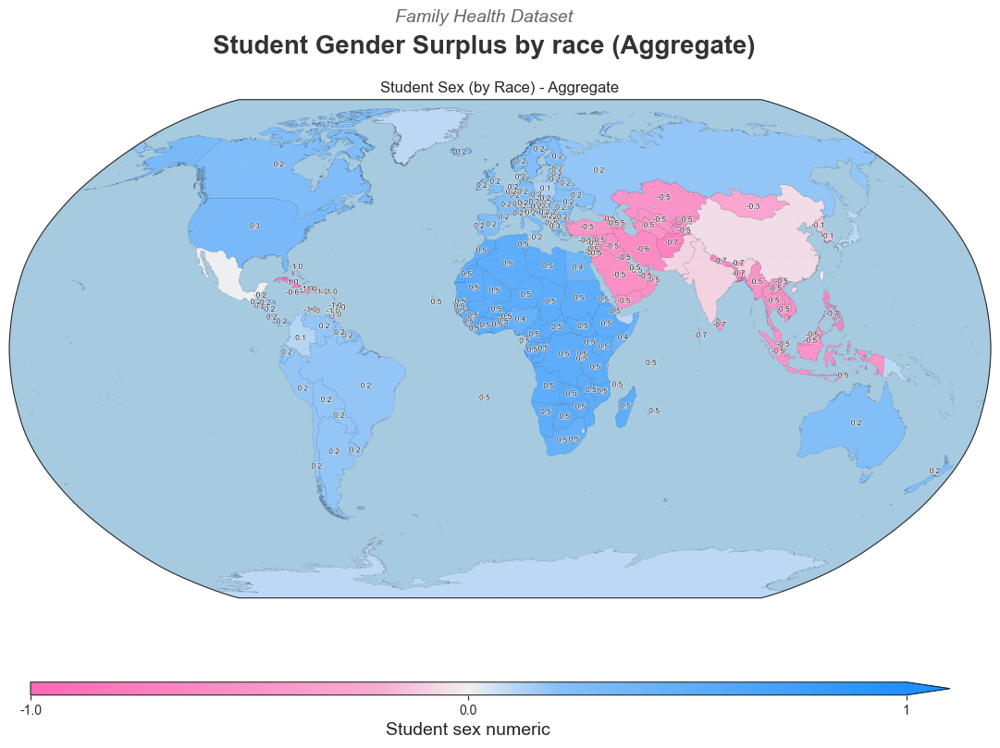

In [15]:
import matplotlib.colors as mcolors
pink_rgb = mcolors.to_rgb('#FF69B4') # Hot Pink
blue_rgb = mcolors.to_rgb('#1E90FF') # Dodger Blue
white_rgb = mcolors.to_rgb('#F0F0F0') # Slightly off-white

cmap = mcolors.LinearSegmentedColormap.from_list("sharper_pink_blue", list(zip([0.0, 0.4, 0.5, 0.6, 1.0], [pink_rgb, (pink_rgb[0]*0.5 + white_rgb[0]*0.5, pink_rgb[1]*0.5 + white_rgb[1]*0.5, pink_rgb[2]*0.5 + white_rgb[2]*0.5), white_rgb, (blue_rgb[0]*0.5 + white_rgb[0]*0.5, blue_rgb[1]*0.5 + white_rgb[1]*0.5, blue_rgb[2]*0.5 + white_rgb[2]*0.5), blue_rgb])))

share_legend = True

fig, axs = plt.subplots(2, 2, figsize=(14, 7), squeeze=False,
                        subplot_kw={'projection': ccrs.Robinson()},
                        gridspec_kw={'wspace': 0, 'hspace': 0.1})

for i,model in enumerate(['ChatGPT','Claude','DeepSeek','Gemini']):

    df = student_df[model]
    df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.fix_country_naming)
    df['Student Country of Origin'] = df['Student Race'].apply(countryHelper.race2country)
    df['Student Sex Numeric'] = df['Student Sex'].apply(sexHelper.sex2standard).map({'Female': -1, 'Male': 1}).fillna(0).astype(int)
    
    axs[i%2][i//2] = chizu.draw(
        df=df,x='Student Country of Origin', y='Student Sex Numeric',
        cmap=cmap, apply_hatching=False, clamp_axis=(-1,1),
        title=f'Student Sex (by Race) - {model}', show_labels=False,
        ax=axs[i%2][i//2],step=1,
        low_poly=False, log=False,
        max_count=3, legend=[0,0,share_legend,0][i],
    )
    
fig.suptitle('Student Gender Surplus by race by Model', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data',f"Student Gender Countries (Map)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data',f"Student Gender Countries (Map).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data',f"Student Gender Countries (Map).eps"), format='eps', bbox_inches='tight')
plt.show()

df = pd.concat([student_df[model] for model in models], ignore_index=True)
df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.fix_country_naming)
df['Student Country of Origin'] = df['Student Race'].apply(countryHelper.race2country)
df['Student Sex Numeric'] = df['Student Sex'].apply(sexHelper.sex2standard).map({'Female': -1, 'Male': 1}).fillna(0).astype(int)

fig, ax = plt.subplots(figsize=(14, 7), subplot_kw={'projection': ccrs.Robinson()})
ax = chizu.draw(
    df=df,x='Student Country of Origin', y='Student Sex Numeric',
    # cmap= sns.diverging_palette(h_neg=340, h_pos=240, center='light', as_cmap=True),
    cmap= cmap,
    title=f'Student Sex (by Race) - Aggregate',
    ax=ax, step=1, show_labels=True, apply_hatching=False,
    low_poly=False, log=False, clamp_axis=(-1,1),
    max_count=3, legend=True,
    legend_loc=[0,-0.1,0,0]
)

fig.suptitle('Student Gender Surplus by race (Aggregate)', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')

plt.savefig(os.path.join('Case Studies',dataset,'data',f"Gender Countries (Map) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data',f"Gender Countries (Map) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data',f"Gender Countries (Map) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Country of Residence (Map + Histogram)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


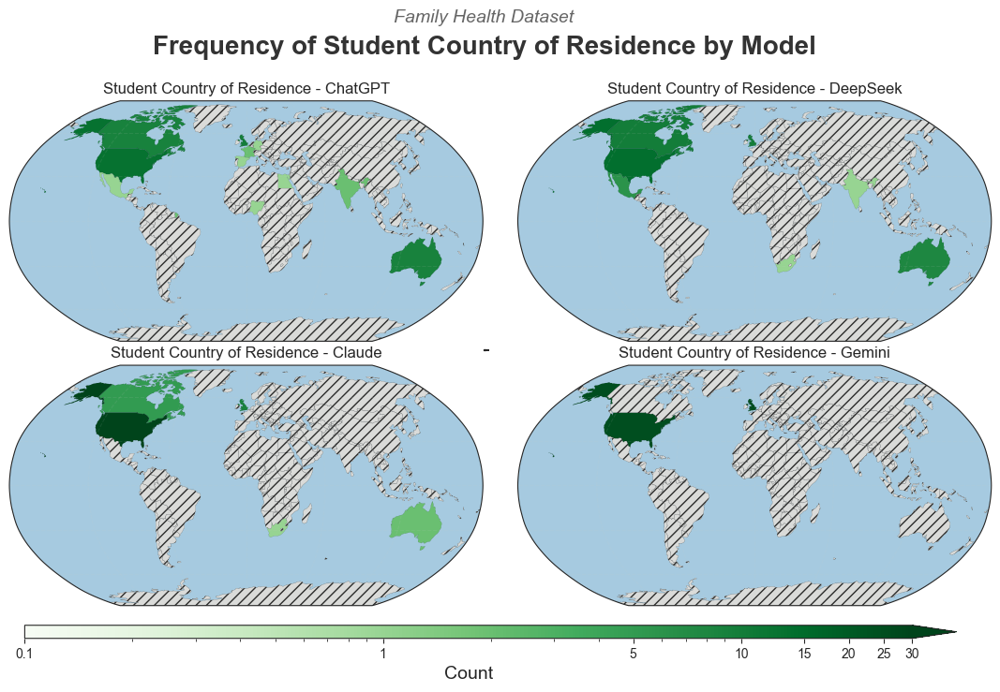

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


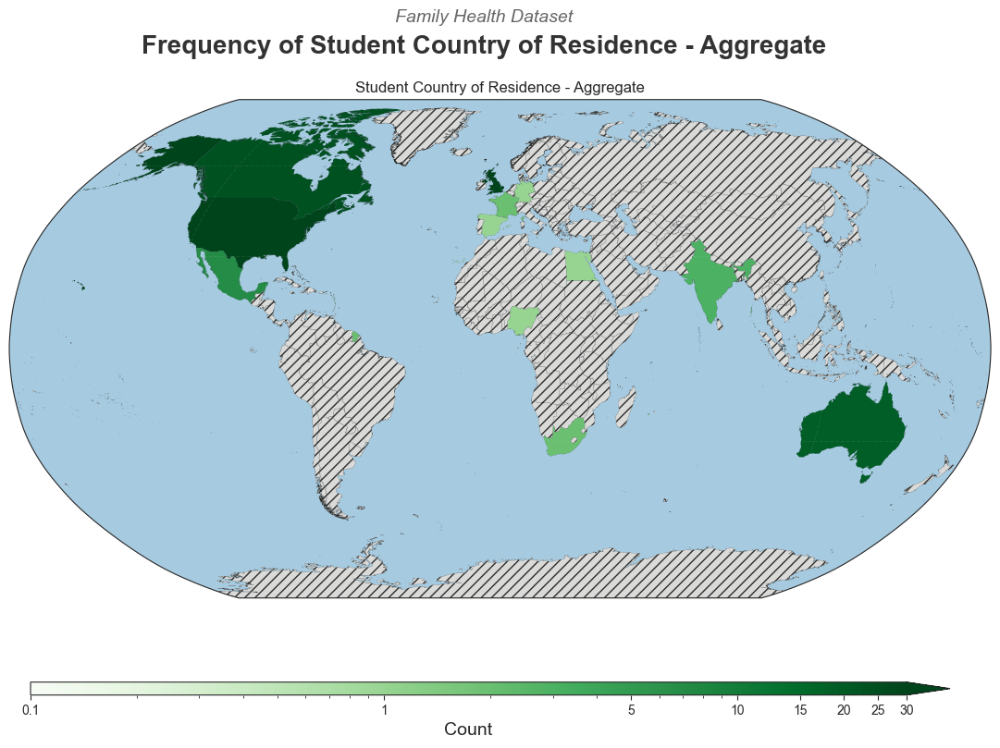

In [16]:
share_legend = True

fig, axs = plt.subplots(2, 2, figsize=(14, 7), squeeze=False,
                        subplot_kw={'projection': ccrs.Robinson()},
                        gridspec_kw={'wspace': 0, 'hspace': 0.1})

for i,model in enumerate(['ChatGPT','Claude','DeepSeek','Gemini']):

    df = student_df[model]
    df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.fix_country_naming)
    
    axs[i%2][i//2] = chizu.draw(
        df=df,x='Student Country of Residence',
        title=f'Student Country of Residence - {model}',
        cmap='Greens', ax=axs[i%2][i//2],
        low_poly=True, log=True, step=5,
        max_count=30, legend=[0,0,share_legend,0][i],
    )

fig.suptitle('Frequency of Student Country of Residence by Model', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country of Residence (Map)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country of Residence (Map).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country of Residence (Map).eps"), format='eps', bbox_inches='tight')
plt.show()

df = pd.concat([student_df[model] for model in models], ignore_index=True)
df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.fix_country_naming)

fig, ax = plt.subplots(figsize=(14, 7), subplot_kw={'projection': ccrs.Robinson()})
ax = chizu.draw(
    df=df,x='Student Country of Residence',
    title=f'Student Country of Residence - Aggregate',
    cmap='Greens', ax=ax,step=5,
    low_poly=False, log=True,
    max_count=30, legend=True,
    legend_loc=[0,-0.1,0,0]
)
fig.suptitle('Frequency of Student Country of Residence - Aggregate', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country of Residence (Map) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country of Residence (Map) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country of Residence (Map) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()


c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:312: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


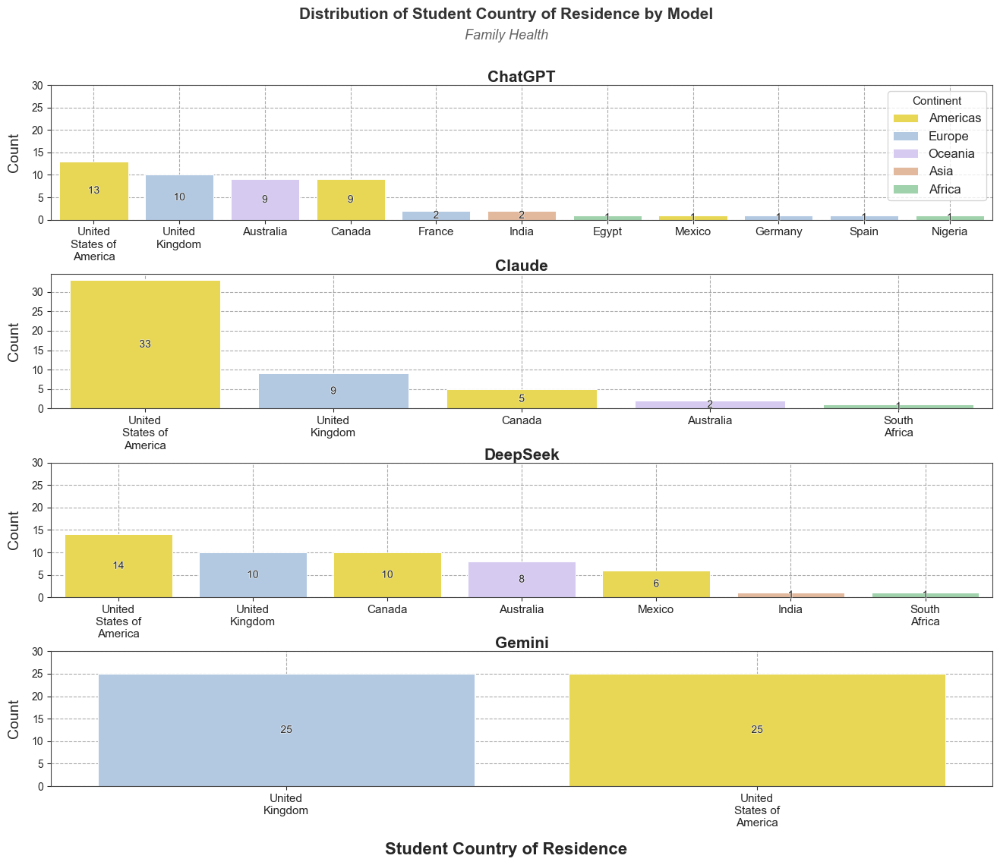

In [17]:
models=['ChatGPT','Claude','DeepSeek','Gemini']
countryHelper = CountryHelper()

df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.country2short)
df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.fix_country_naming)
df['Region'] = df['Student Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['subregion']
)
df['Continent'] = df['Student Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['region']
)

plt = histogram.draw(
    df=df,x='Student Country of Residence',
    hue='Continent', text_width=10, bar_labels=True,
    dataset=dataset, grid=True, ylim=30,ystep=5,
    aggregate=False,long_layout=True, title_size=15,
    figsize=(16,12), rotation=0,hspace=0.4
)
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country of Residence (Histogram)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country of Residence (Histogram).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country of Residence (Histogram).eps"), format='eps', bbox_inches='tight')
plt.show()

### Country Ordering (Stacked)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


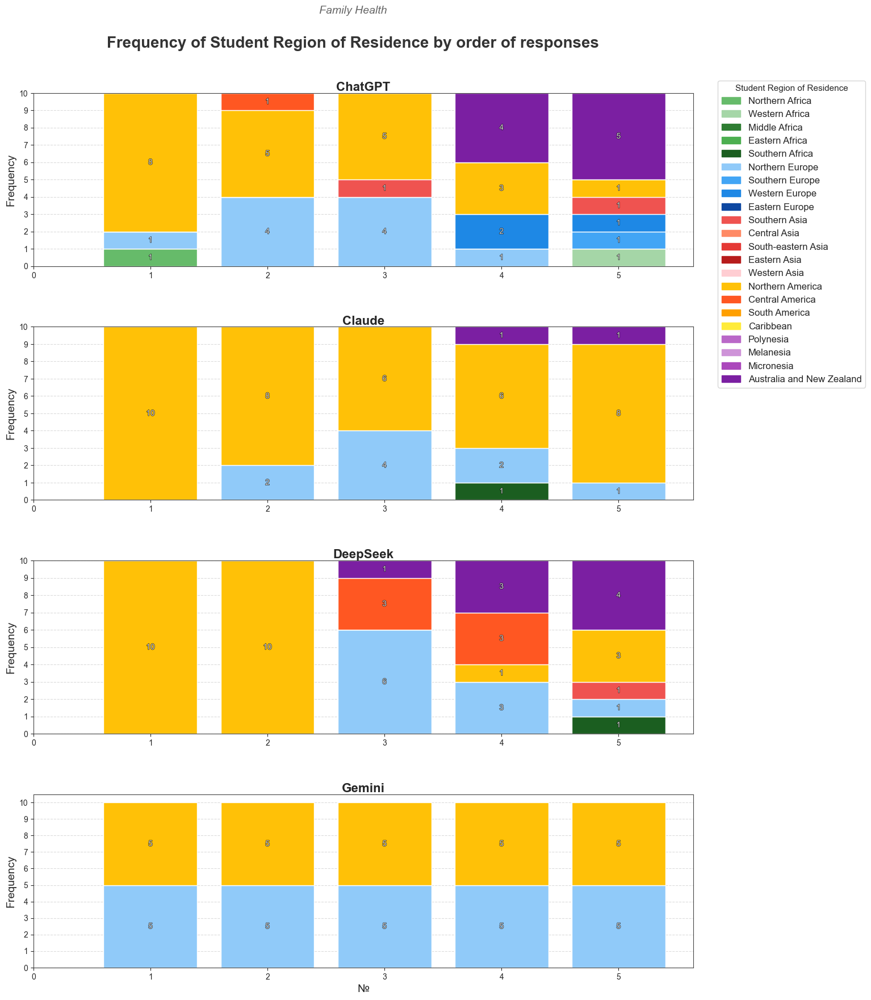

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


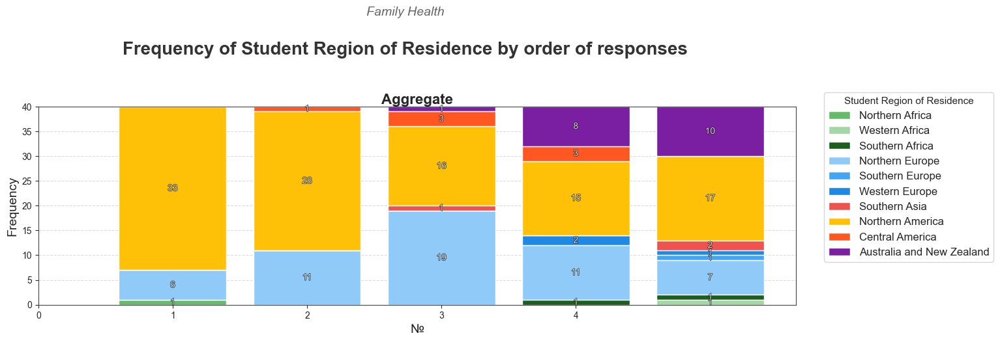

In [18]:
df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.country2short)
df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.fix_country_naming)
df['Student Region of Residence']  = df['Student Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['subregion']
)
df['Continent'] = df['Student Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['region']
)

plt = stackedBar.draw(
    df=df,x='№',stacked_hue='Student Region of Residence',
    space=0.35, ylim=10, bar_labels=True, dataset=dataset,
    figsize=(15,20), grid=True, legend=True
)
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country Ordering (Stacked)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country Ordering (Stacked).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country Ordering (Stacked).eps"), format='eps', bbox_inches='tight')
plt.show()

plt = stackedBar.draw(
    df=df,x='№',stacked_hue='Student Region of Residence', aggregate=True,
    space=0.35, ylim=40, bar_labels=True, dataset=dataset, ystep=5,
    figsize=(15,20), grid=True, legend=True
)
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country Ordering (Stacked) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country Ordering (Stacked) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Country Ordering (Stacked) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Age and Country of Residence

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


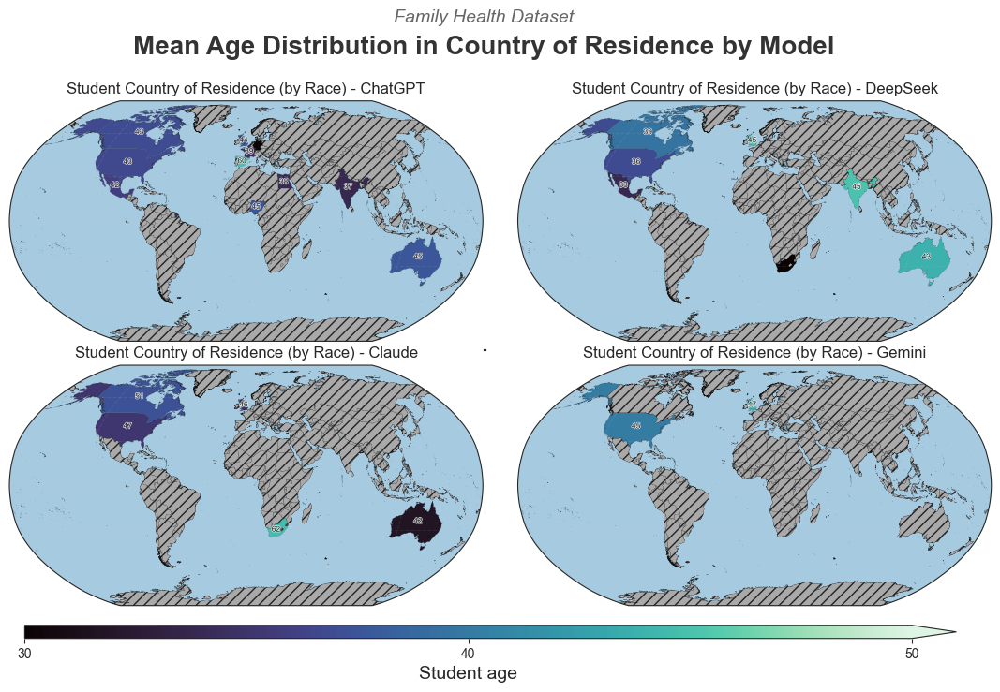

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


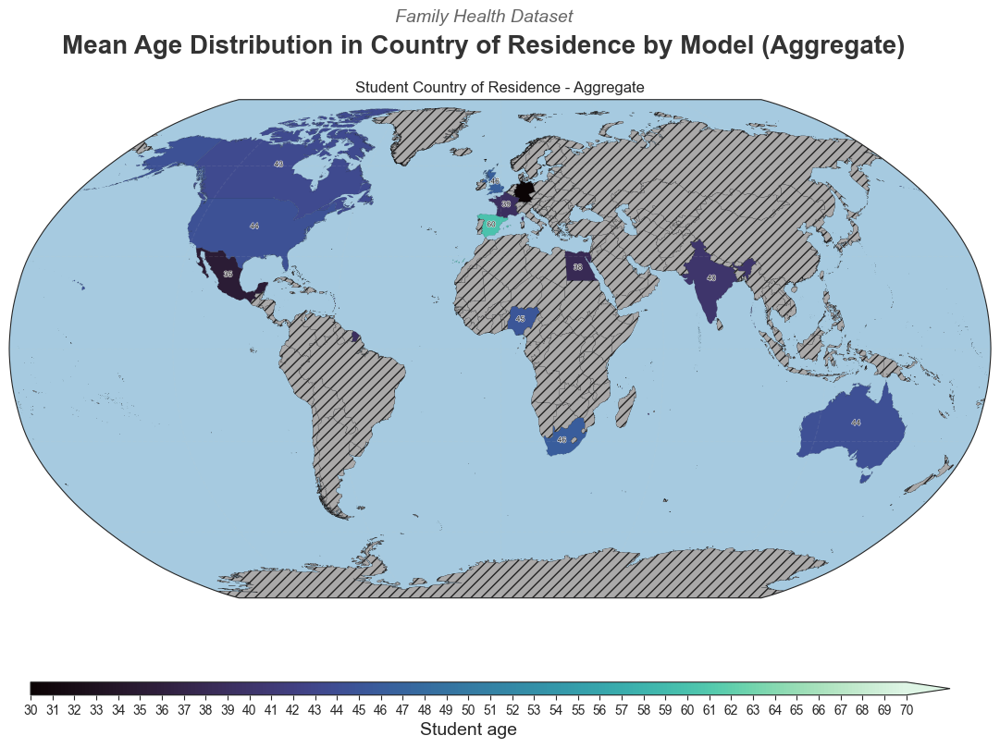

In [19]:
share_legend = True

fig, axs = plt.subplots(2, 2, figsize=(14, 7), squeeze=False,
                        subplot_kw={'projection': ccrs.Robinson()},
                        gridspec_kw={'wspace': 0, 'hspace': 0.1})

for i,model in enumerate(['ChatGPT','Claude','DeepSeek','Gemini']):

    df = student_df[model]
    df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.fix_country_naming)
    df['Student Country of Origin'] = df['Student Race'].apply(countryHelper.race2country)
    
    axs[i%2][i//2] = chizu.draw(
        df=df,x='Student Country of Residence', y='Student Age',
        title=f'Student Country of Residence (by Race) - {model}',
        cmap='mako', ax=axs[i%2][i//2], step=10,
        low_poly=False, log=False, show_labels=True,
        max_count=60, legend=[0,0,share_legend,0][i],
    )
    
fig.suptitle('Mean Age Distribution in Country of Residence by Model', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Age and Country of Residence (Map)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Age and Country of Residence (Map).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Age and Country of Residence (Map).eps"), format='eps', bbox_inches='tight')
plt.show()

df = pd.concat([student_df[model] for model in models], ignore_index=True)
df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.fix_country_naming)
df['Student Country of Origin'] = df['Student Race'].apply(countryHelper.race2country)

fig, ax = plt.subplots(figsize=(14, 7), subplot_kw={'projection': ccrs.Robinson()})
ax = chizu.draw(
    df=df,x='Student Country of Residence',y='Student Age',
    title=f'Student Country of Residence - Aggregate',
    cmap='mako', ax=ax, step=1,
    low_poly=False, log=False, show_labels=True,
    max_count=60, legend=True,
    legend_loc=[0,-0.1,0,0]
)
fig.suptitle('Mean Age Distribution in Country of Residence by Model (Aggregate)', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Age and Country of Residence (Map) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Age and Country of Residence (Map) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Age and Country of Residence (Map) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


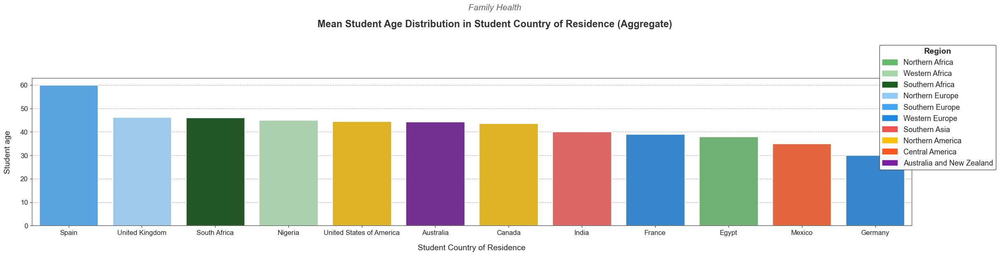

In [20]:
models=['ChatGPT','Claude','DeepSeek','Gemini']
countryHelper = CountryHelper()

df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.country2short)
df['Student Country of Residence'] = df['Student Country of Residence'].apply(countryHelper.fix_country_naming)
df['Student Country of Origin'] = df['Student Race'].apply(countryHelper.race2country)

df_2 = countryHelper.get_country_average_y(df,x='Student Country of Residence',y='Student Age')
df_2['Continent'] = df_2['Student Country of Residence'].apply(lambda x: countryHelper.country2region(x)['region'])
df_2['Region']    = df_2['Student Country of Residence'].apply(lambda x: countryHelper.country2region(x)['subregion'])

plt = histogram.draw(
    df=df_2,x='Student Country of Residence', y='Student Age',
    hue='Region', ylim=60, ystep=10,
    dataset=f"{dataset}\n\n", aggregate=True,
    long_layout=True, legend=(1.1,1.25),
    title_size=17,rotation=0,
    figsize=(9,9)
)
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Age and Country of Residence (Histogram) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Age and Country of Residence (Histogram) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Age and Country of Residence (Histogram) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Employment by Subsector

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:556: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])


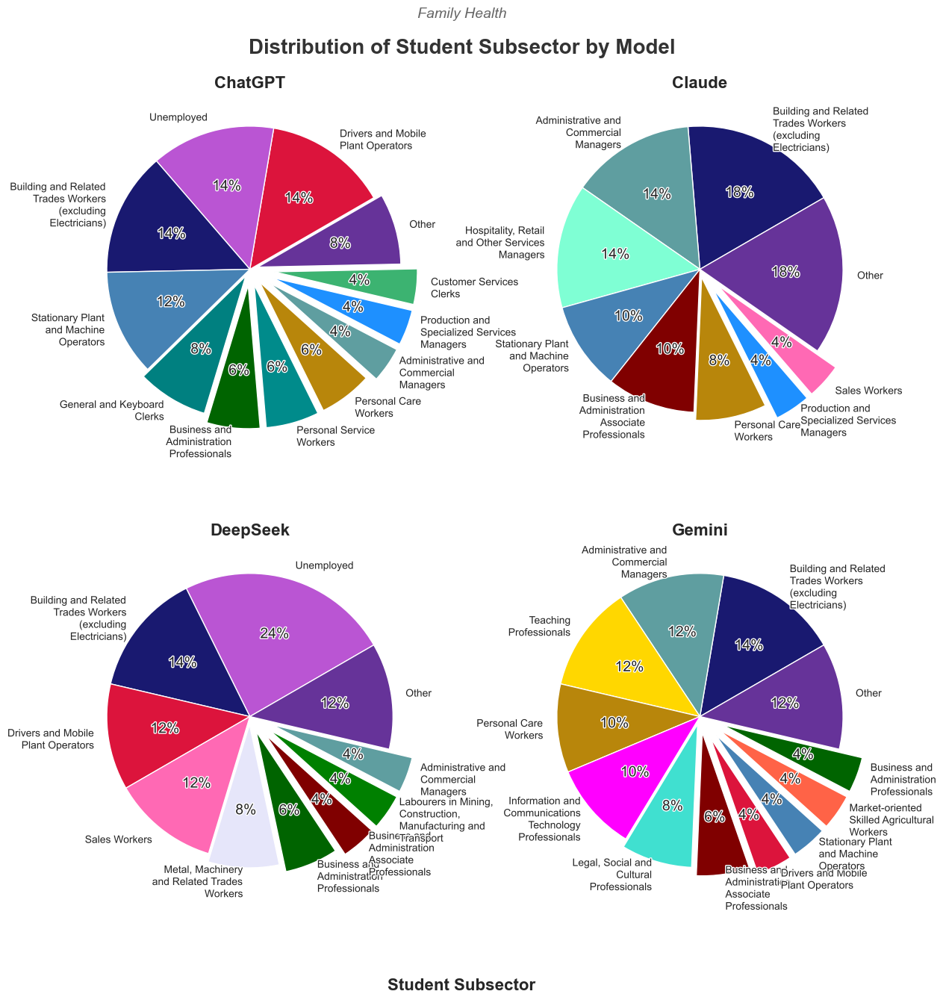

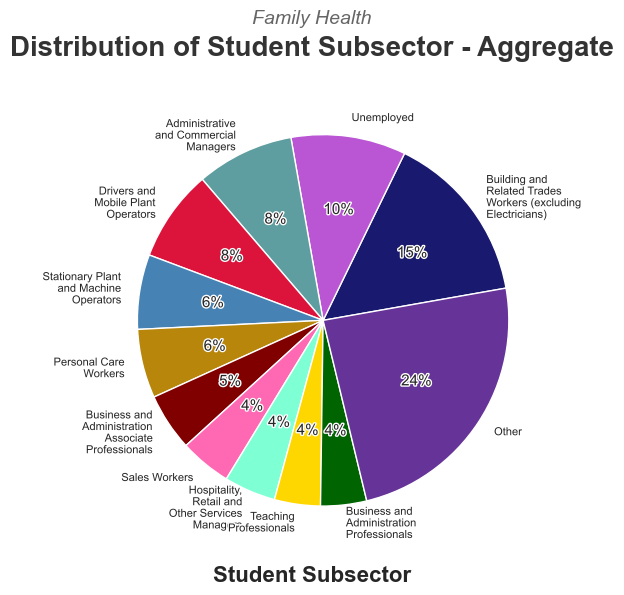

In [21]:
df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Sector']    = df['Student Employment'].apply(lambda job: jobHelper.employment2sector(job))
df['Student Subsector'] = df['Student Employment'].apply(lambda job: jobHelper.employment2subsector(job))

plt = piechart.draw(
    df,x="Student Subsector",
    dataset=dataset, figsize=(14,14),
    aggregate=False, other=0.04,
    text_width=18, rotation=30, space=0.25,
)
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Employment by Subsector (Piechart)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Employment by Subsector (Piechart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Employment by Subsector (Piechart).eps"), format='eps', bbox_inches='tight')
plt.show()

plt = piechart.draw(
    df,x="Student Subsector",
    dataset=dataset,
    aggregate=True, other=0.04,
    text_width=15, rotation=10,
    figsize=(6,6),
)
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Employment by Subsector (Piechart) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Employment by Subsector (Piechart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Employment by Subsector (Piechart) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

Student Sector


c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:312: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


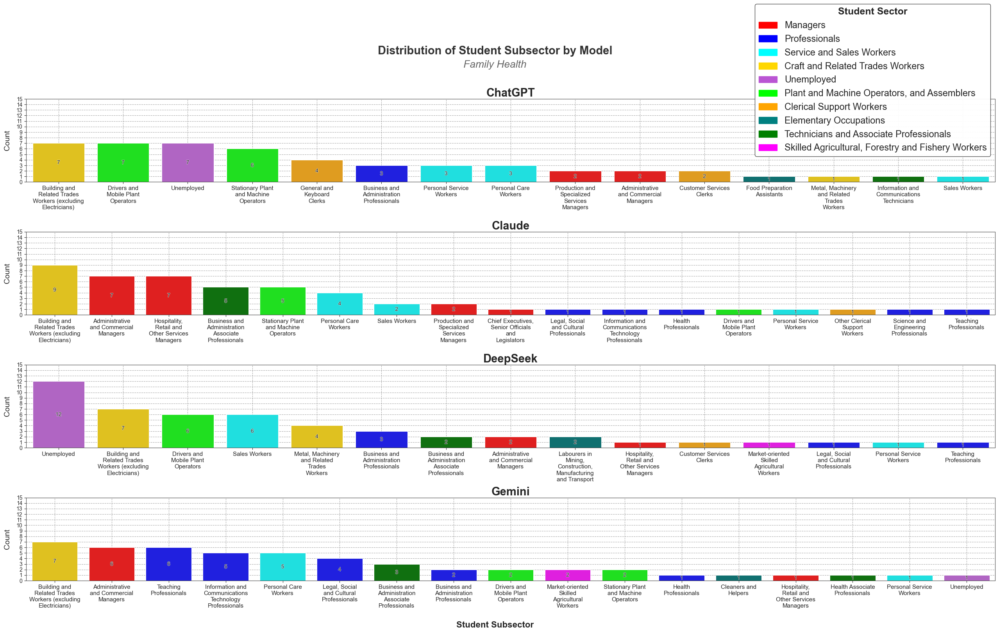

In [22]:
df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Sector']    = df['Student Employment'].apply(lambda job: jobHelper.employment2sector(job))
df['Student Subsector'] = df['Student Employment'].apply(lambda job: jobHelper.employment2subsector(job))

histogram = Histogram(models)
plt = histogram.draw(
    df,x='Student Subsector', hue='Student Sector',
    dataset=dataset,legend=(1,2.2),
    aggregate=False,long_layout=True,
    rotation=0, text_width=15, bar_labels=True,
    hspace=0.6,figsize=(32,16),
    title_size=21, grid=True
    # xtick_label_max_len=25
)
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Employment by Subsector (Histogram)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Employment by Subsector (Histogram).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Employment by Subsector (Histogram).eps"), format='eps', bbox_inches='tight')
plt.show()

### Employment by Sector

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:556: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])


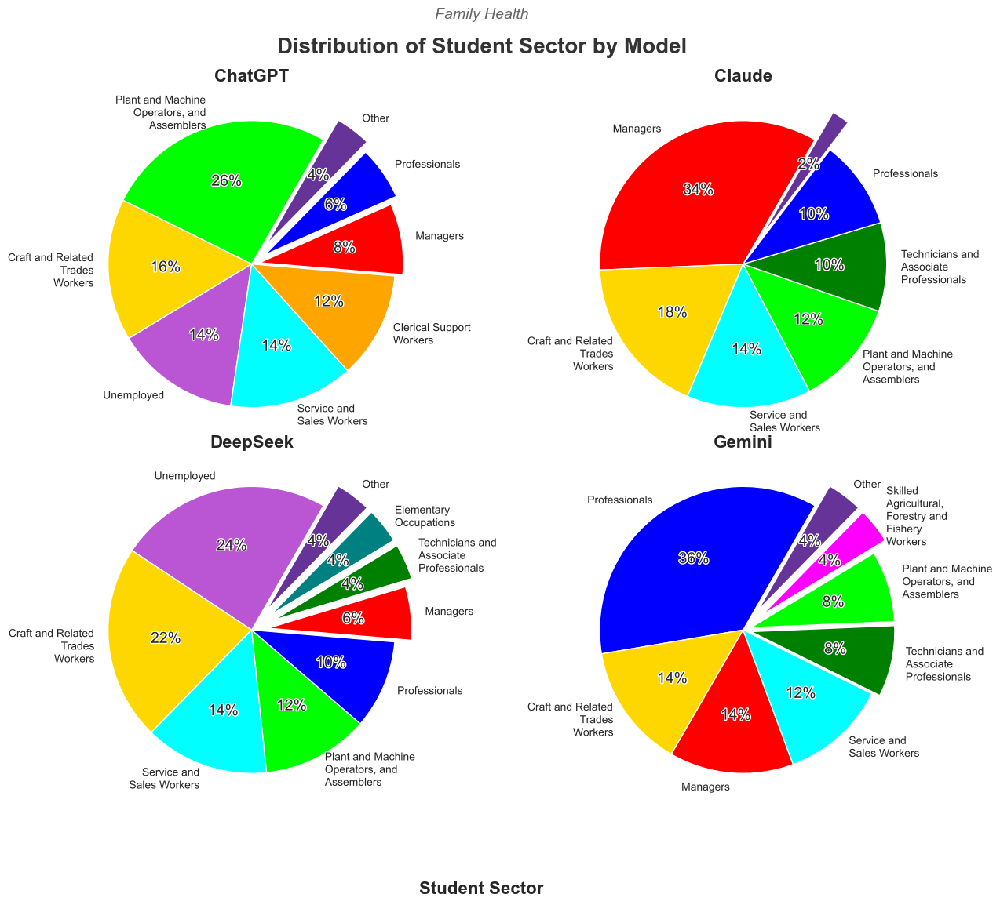

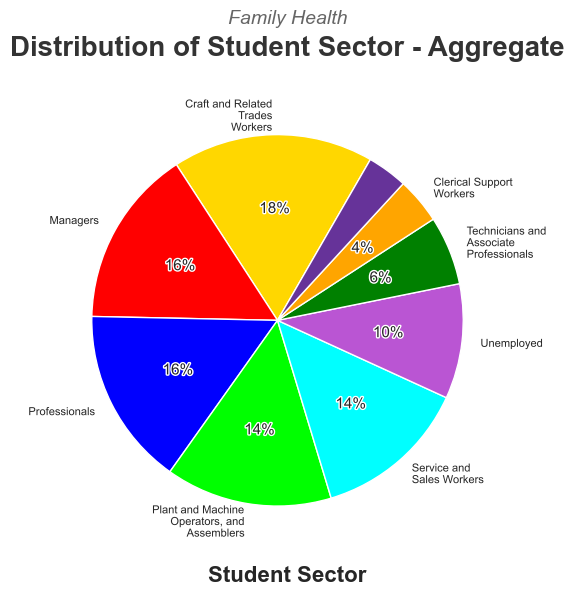

In [23]:
df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Sector']    = df['Student Employment'].apply(lambda job: jobHelper.employment2sector(job))
df['Student Subsector'] = df['Student Employment'].apply(lambda job: jobHelper.employment2subsector(job))

plt = piechart.draw(
    df,x="Student Sector",
    dataset=dataset,
    aggregate=False, other=0.04, space=0.02,
    text_width=15, rotation=60
)
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Employment by Sector (Piechart)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Employment by Sector (Piechart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Employment by Sector (Piechart).eps"), format='eps', bbox_inches='tight')
plt.show()

plt = piechart.draw(
    df,x="Student Sector", figsize=(6,6),
    dataset=dataset,
    aggregate=True, other=0.04,
    space=0.05, text_width=15, rotation=60,
)
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Employment by Sector (Piechart) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Employment by Sector (Piechart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Employment by Sector (Piechart) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Age, Education, Gender (BarChart)

high school diploma high school diploma high school graduate high school graduate high school graduate high school graduate primary school graduate high school graduate high school diploma high school diploma high school diploma high school graduate secondary school graduate high school graduate high school graduate high school diploma associate’s degree high school diploma high school diploma secondary school high school graduate associate’s degree high school graduate university graduate high school diploma high school diploma high school graduate high school graduate high school diploma secondary education high school diploma high school diploma ged high school diploma high school diploma high school diploma high school education high school diploma secondary school education high school diploma high school diploma high school diploma high school education high school diploma high school diploma high school diploma high school diploma ged high school diploma ged high school diploma 

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:297: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:297: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:297: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\anaconda3\envs\gender\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 6.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


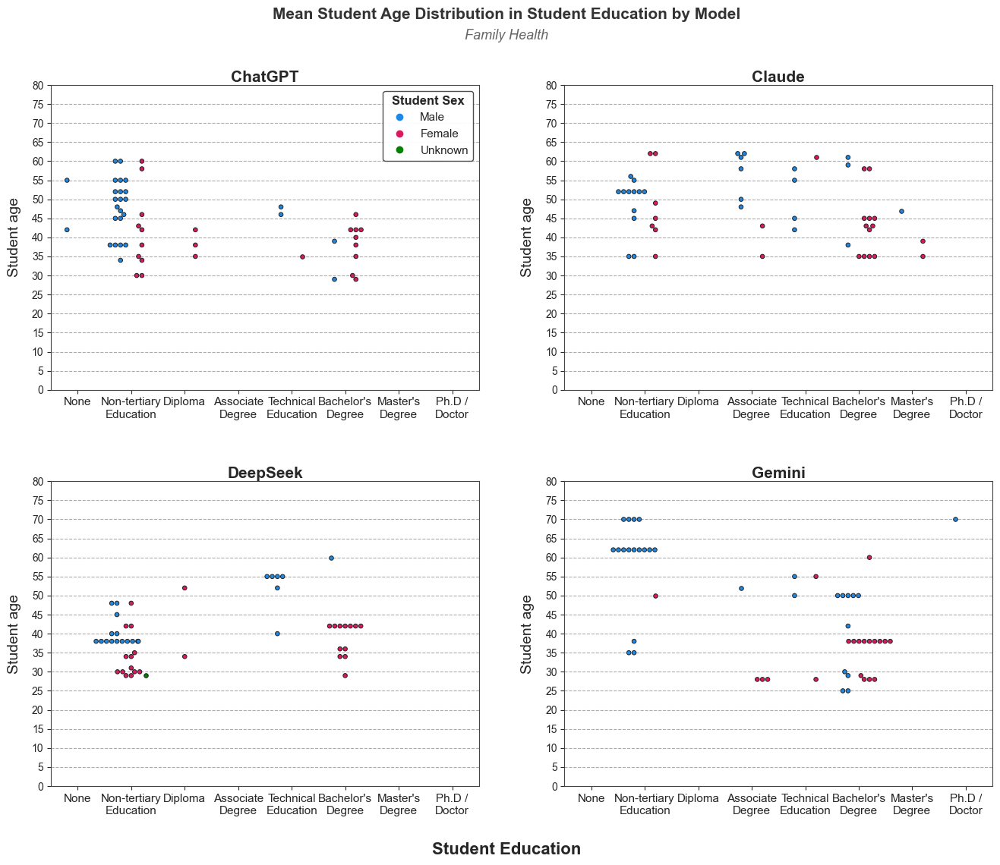

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


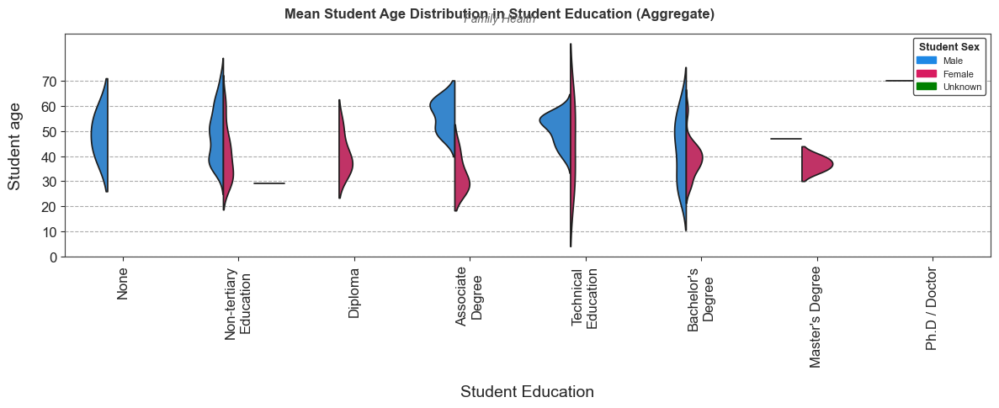

In [24]:
df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Education'] = df['Student Education'].apply(jobHelper.education2certification)
df['Student Sex'] = df['Student Sex'].apply(sexHelper.sex2standard)

plt = histogram.draw(
    df=df,x='Student Education',
    hue='Student Sex',y='Student Age',
    dataset=dataset,legend=(1,1),
    aggregate=False, text_width=12,
    rotation=0, ylim=80, ystep=5, violin=False,swarm=True,
    figsize=(16,12), grid=True, title_size=15
)
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Age Education Gender (BarChart)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Age Education Gender (BarChart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Age Education Gender (BarChart).eps"), format='eps', bbox_inches='tight')
plt.show()

plt = histogram.draw(
    df=df,x='Student Education',
    hue='Student Sex',y='Student Age',
    dataset=dataset, legend = (1,1),
    aggregate=True, text_width=15,
    rotation=90, ylim=70, ystep=10, violin=True,swarm=False,
    figsize=(12,5), grid=True, 
)
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Age Education Gender (BarChart) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Age Education Gender (BarChart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Age Education Gender (BarChart) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Age, Employment, Gender (BarChart)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:297: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:297: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:297: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:297: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#8

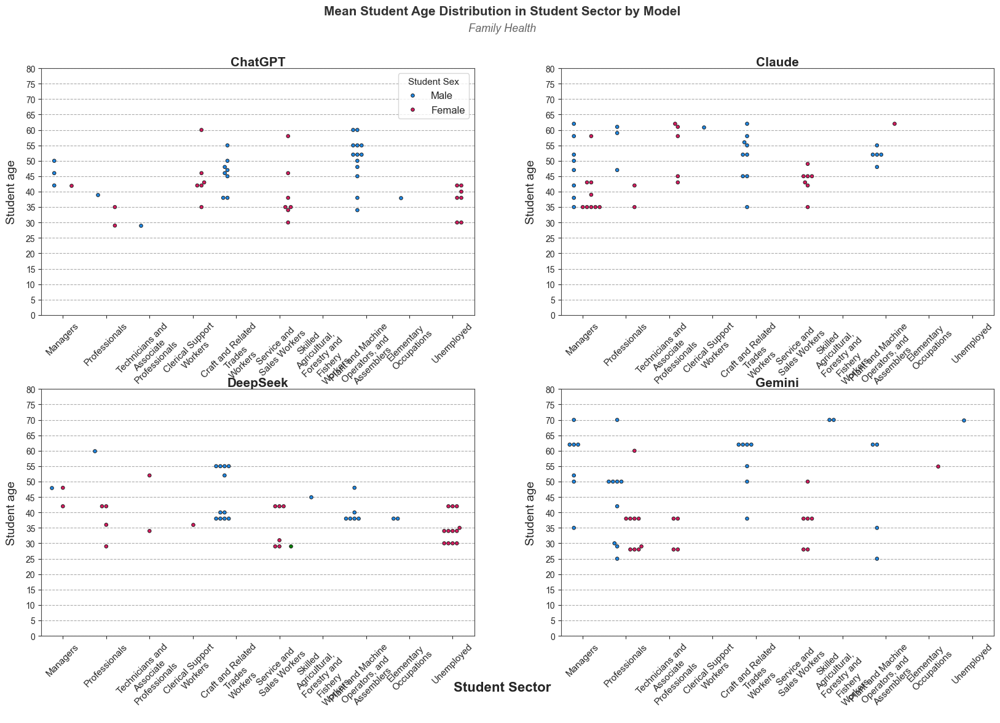

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


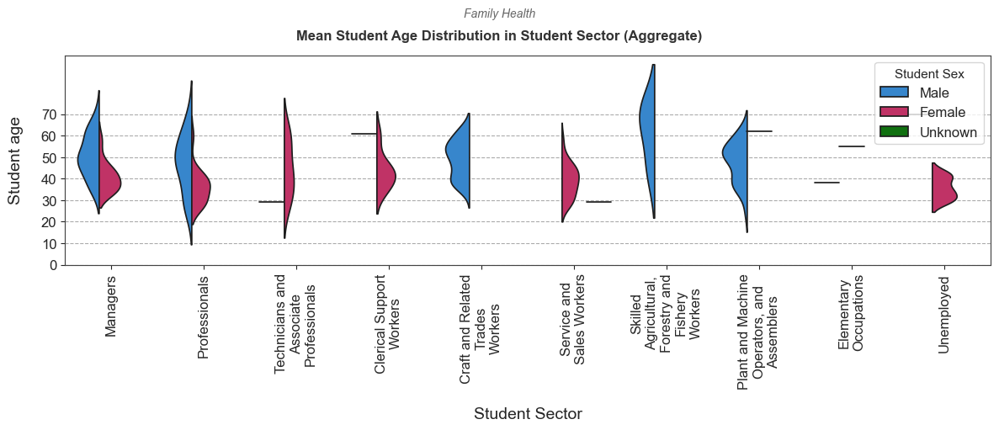

In [25]:
df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Sector'] = df['Student Employment'].apply(jobHelper.employment2sector)   
df['Student Sex']    = df['Student Sex'].apply(sexHelper.sex2standard)

plt = histogram.draw(
    df=df,x='Student Sector',
    hue='Student Sex',y='Student Age',
    dataset=dataset,
    aggregate=False, text_width=15,
    rotation=45, ylim=80, ystep=5, violin=False,swarm=True,
    figsize=(20,12), grid=True, title_size=15,
)
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Age Employment Gender (BarChart)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Age Employment Gender (BarChart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Age Employment Gender (BarChart).eps"), format='eps', bbox_inches='tight')
plt.show()

plt = histogram.draw(
    df=df,x='Student Sector',
    hue='Student Sex',y='Student Age',
    dataset=f"{dataset}\n\n",
    aggregate=True, text_width=15,
    rotation=90, ylim=70, ystep=10, violin=True,swarm=False,
    figsize=(12,5), grid=True, 
)
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Age Employment Gender (BarChart) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Age Employment Gender (BarChart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Age Employment Gender (BarChart) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Gender (Piechart)

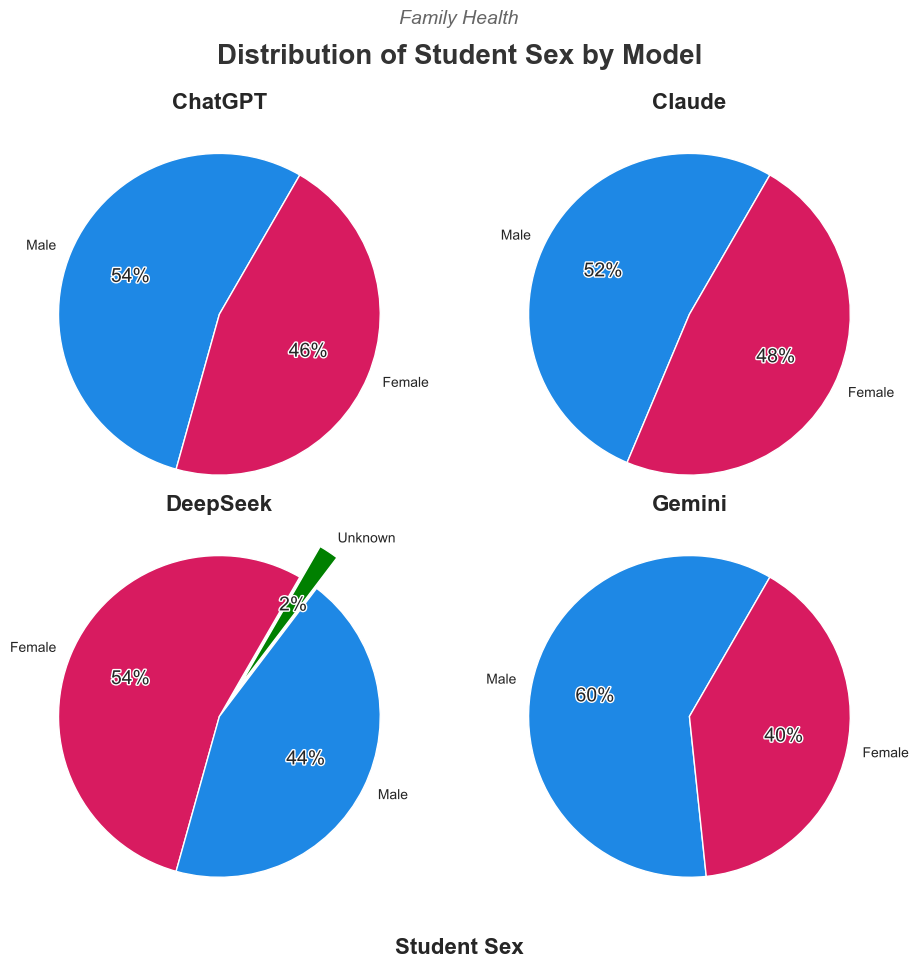

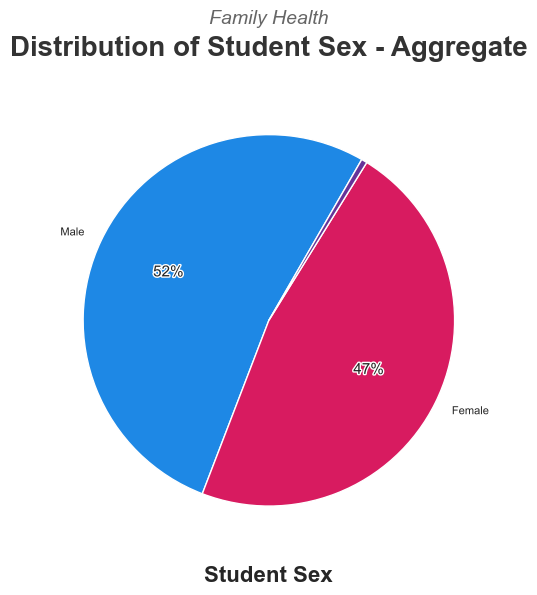

In [26]:
df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Sex'] = df['Student Sex'].apply(sexHelper.sex2standard)

plt = piechart.draw(
    df, x="Student Sex",
    dataset=dataset,
    aggregate=False, other=0.00,
    text_width=15, rotation=60,
    figsize=(10,10),space=0,
)
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Gender (Piechart)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Gender (Piechart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Gender (Piechart).eps"), format='eps', bbox_inches='tight')
plt.show()

plt = piechart.draw(
    df, x="Student Sex",
    dataset=dataset,
    aggregate=True, other=0.04,
    text_width=15, rotation=60,
    figsize=(6,6),space=0,
)
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Gender (Piechart) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Gender (Piechart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Gender (Piechart) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Gender and order of responses (Stacked Bar Chart)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


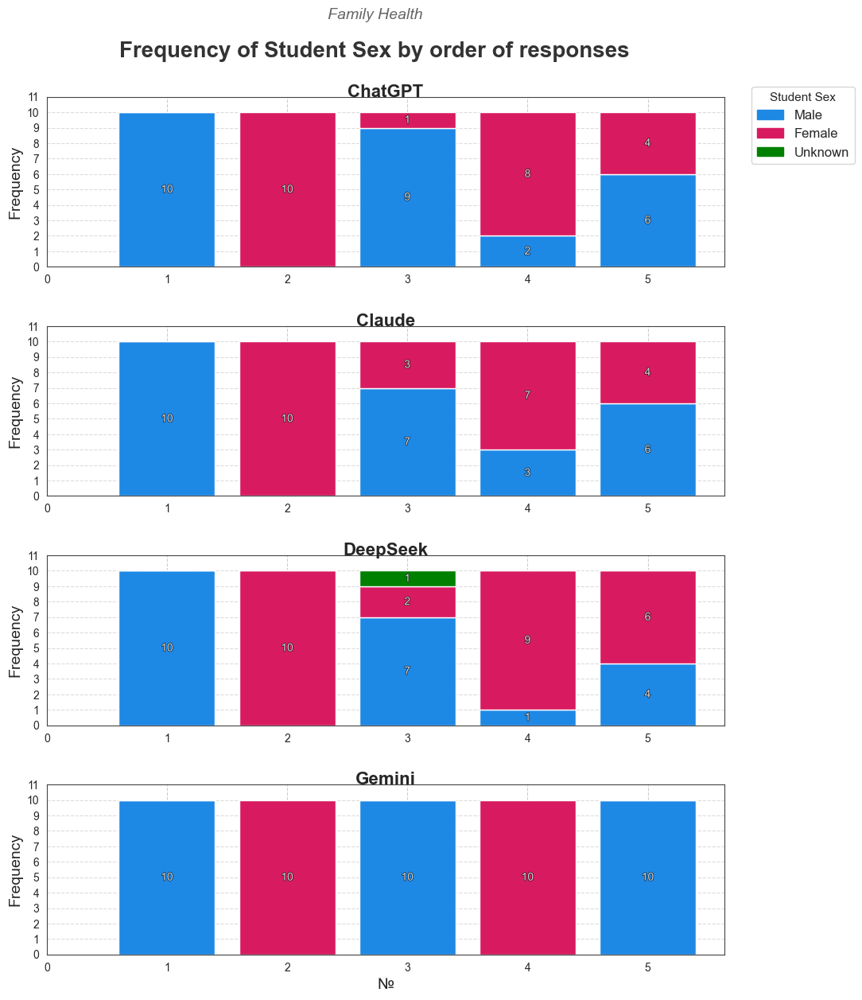

In [27]:
df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Sector']    = df['Student Employment'].apply(jobHelper.employment2sector)
df['Student Subsector'] = df['Student Employment'].apply(jobHelper.employment2subsector)
df['Student Sex']       = df['Student Sex'].apply(sexHelper.sex2standard)


plt = stackedBar.draw(
    df=df,x='№',stacked_hue='Student Sex',
    space=0.35, ylim=11, bar_labels=True,
    figsize=(11,14), grid=True,dataset=dataset
)
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Gender and order of responses (Stacked Bar Chart)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Gender and order of responses (Stacked Bar Chart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Gender and order of responses (Stacked Bar Chart).eps"), format='eps', bbox_inches='tight')
plt.show()

### Gender and Employment (Stacked Bar Chart)

high school diploma high school diploma high school graduate high school graduate high school graduate high school graduate primary school graduate high school graduate high school diploma high school diploma high school diploma high school graduate secondary school graduate high school graduate high school graduate high school diploma associate’s degree high school diploma high school diploma secondary school high school graduate associate’s degree high school graduate university graduate high school diploma high school diploma high school graduate high school graduate high school diploma secondary education high school diploma high school diploma ged high school diploma high school diploma high school diploma high school education high school diploma secondary school education high school diploma high school diploma high school diploma high school education high school diploma high school diploma high school diploma high school diploma ged high school diploma ged high school diploma 

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


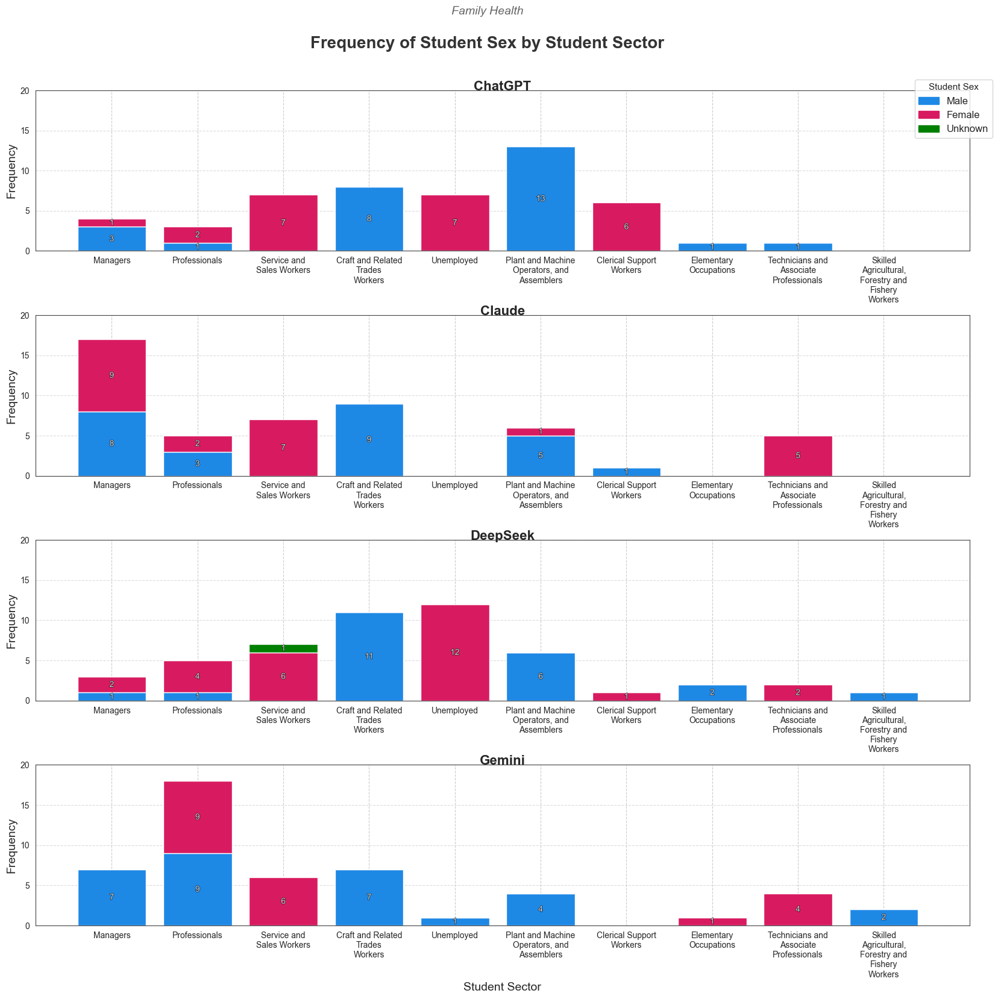

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


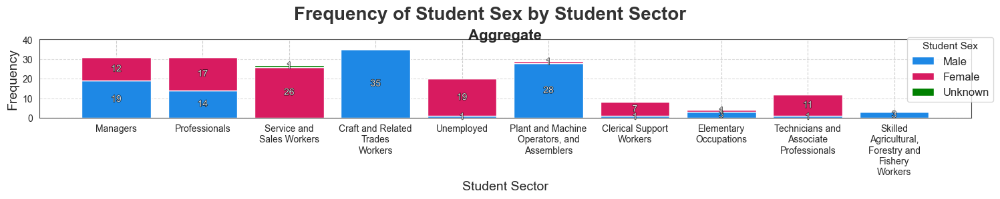

In [28]:
df = pd.concat([student_df.copy()[model].assign(model=model) for model in models], ignore_index=True)
df['Student Sector']    = df['Student Employment'].apply(jobHelper.employment2sector)   
df['Student Subsector'] = df['Student Employment'].apply(jobHelper.employment2subsector)
df['Student Education'] = df['Student Education'].apply(jobHelper.education2certification)
df['Student Sex']       = df['Student Sex'].apply(sexHelper.sex2standard)

plt = stackedBar.draw(
    df=df,x='Student Sector',stacked_hue='Student Sex', grid=True,
    aggregate=False, figsize=(20,18), bar_labels=True,
    space=0.4, ylim=20, ystep=5,txt_width=15, dataset=dataset
)
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Gender and Employment (Stacked Bar Chart)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Gender and Employment (Stacked Bar Chart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Gender and Employment (Stacked Bar Chart).eps"), format='eps', bbox_inches='tight')
plt.show()


plt = stackedBar.draw(
    df=df,x='Student Sector',stacked_hue='Student Sex', grid=True, 
    space=0.85, ylim=40, ystep=10, bar_labels=True,
    txt_width=15, figsize=(18,10), aggregate=True,
)
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Gender and Employment (Stacked Bar Chart) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Gender and Employment (Stacked Bar Chart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Gender and Employment (Stacked Bar Chart) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()


### Gender and Education (Stacked Bar Chart)

high school diploma high school diploma high school graduate high school graduate high school graduate high school graduate primary school graduate high school graduate high school diploma high school diploma high school diploma high school graduate secondary school graduate high school graduate high school graduate high school diploma associate’s degree high school diploma high school diploma secondary school high school graduate associate’s degree high school graduate university graduate high school diploma high school diploma high school graduate high school graduate high school diploma secondary education high school diploma high school diploma ged high school diploma high school diploma high school diploma high school education high school diploma secondary school education high school diploma high school diploma high school diploma high school education high school diploma high school diploma high school diploma high school diploma ged high school diploma ged high school diploma 

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


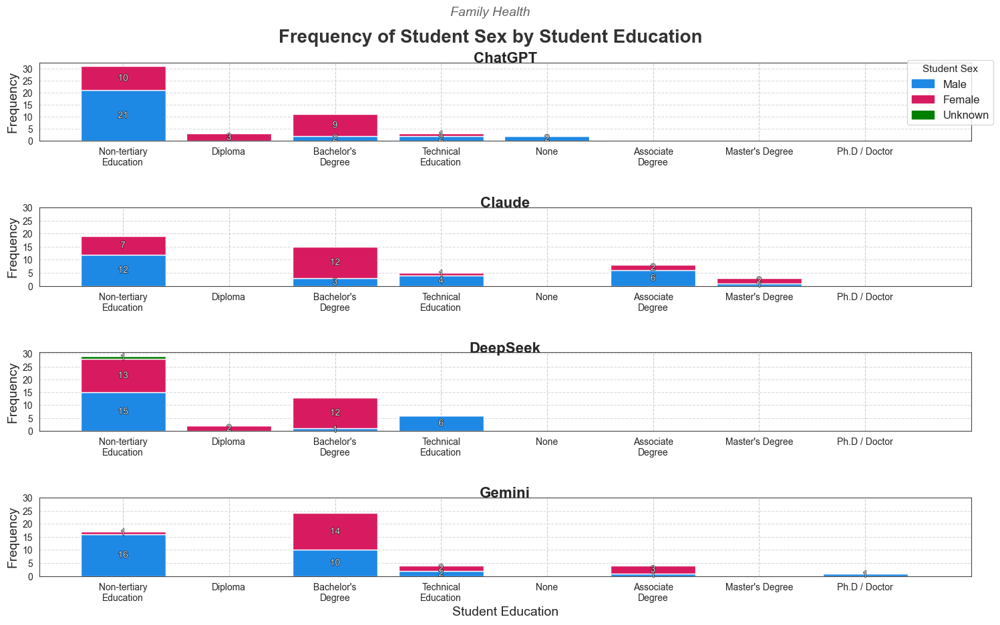

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


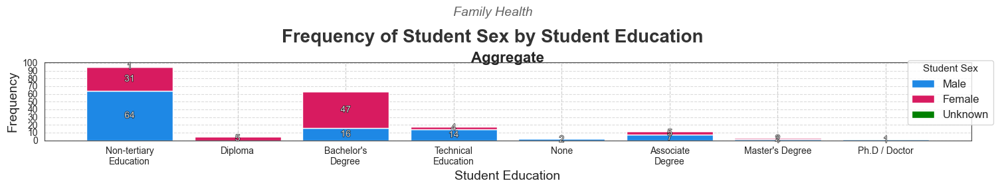

In [29]:
from draw import squeeze_text

dfs = {
    case_study: {
        model: pd.read_csv(os.path.join("Case Studies", case_study, f'{model}.csv'))
        for model in models
    }
    for case_study in case_studies
}

df = pd.concat([dfs[dataset][model].assign(model=model) for model in models], ignore_index=True)
df['Student Education'] = df['Student Education'].apply(jobHelper.education2certification)
df['Student Sex'] = df['Student Sex'].apply(sexHelper.sex2standard)

plt = stackedBar.draw(
    df=df, x='Student Education', stacked_hue='Student Sex', grid=True,
    space=0.85, ylim=30, ystep=5, bar_labels=True,
    txt_width=15, figsize=(18,10), dataset=dataset
)
plt.savefig(os.path.join('Case Studies', dataset, 'data', f"Gender and Student Education (Stacked Bar Chart)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies', dataset, 'data', f"Gender and Student Education (Stacked Bar Chart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies', dataset, 'data', f"Gender and Student Education (Stacked Bar Chart).eps"), format='eps', bbox_inches='tight')
plt.show()

plt = stackedBar.draw(
    df=df, x='Student Education', stacked_hue='Student Sex', grid=True,
    space=0.85, ylim=100, ystep=10, bar_labels=True,
    txt_width=15, figsize=(18,10), aggregate=True, dataset=dataset
)
plt.savefig(os.path.join('Case Studies', dataset, 'data', f"Gender and Student Education (Stacked Bar Chart) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies', dataset, 'data', f"Gender and Student Education (Stacked Bar Chart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies', dataset, 'data', f"Gender and Student Education (Stacked Bar Chart) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()


### Gender and Age (Population Pyramid)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:580: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = df.groupby([stacked_hue, x,hue]).size().reset_index(name='count')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:618: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(x)[y].sum().reindex(xlabels, fill_value=0)
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:620: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupb

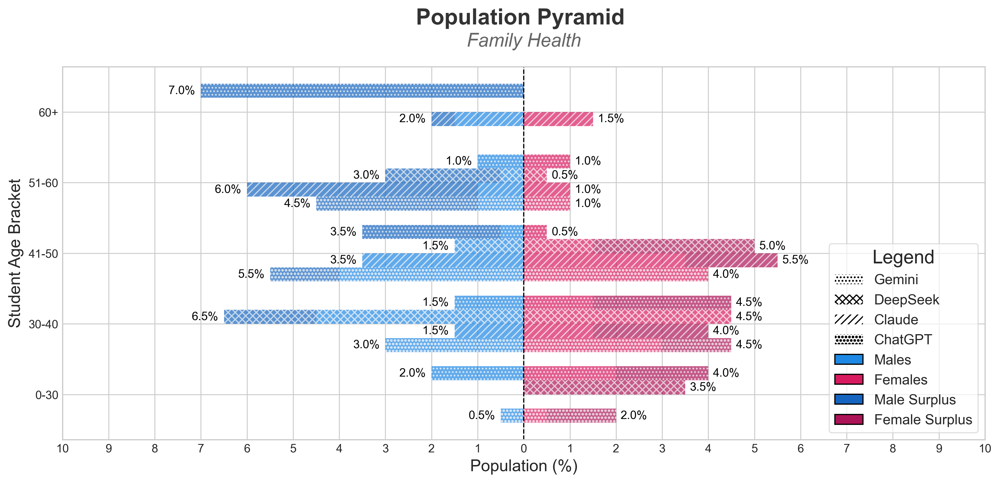

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:580: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = df.groupby([stacked_hue, x,hue]).size().reset_index(name='count')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:587: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  males   = df[df[stacked_hue] == 'Male'  ].groupby(x)[y].sum().reindex(xlabels, fill_value=0)
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:588: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future de

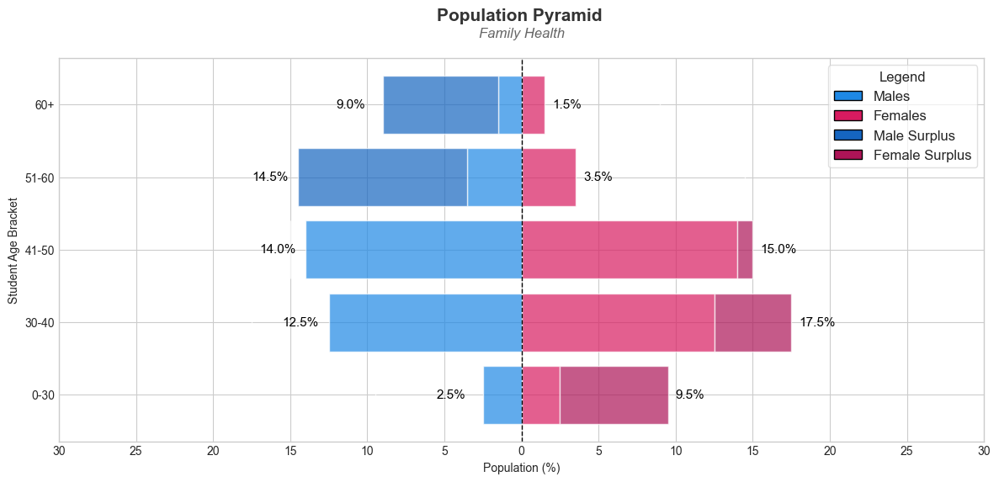

In [30]:
df = pd.concat([student_df[model].assign(model=model) for model in models], ignore_index=True)
df['Student Sex'] = df['Student Sex'].apply(sexHelper.sex2standard)


xlabels = ['0-30', '30-40', '41-50', '51-60', '60+']
df['Student Age Bracket'] = pd.cut(df['Student Age'], bins=[0, 30, 40, 50, 60, 100], labels=xlabels)

from draw import PopulationPyramid
pPyramid = PopulationPyramid(models=models)

plt = pPyramid.draw(
    df=df,x='Student Age Bracket',stacked_hue='Student Sex',dataset=dataset,
    xlabels=xlabels,aggregate=False, fontsize=14, figsize=(12,6)
)
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Gender and Age (Population Pyramid)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Gender and Age (Population Pyramid).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Gender and Age (Population Pyramid).eps"), format='eps', bbox_inches='tight')
plt.show()

plt = pPyramid.draw(
    df=df,x='Student Age Bracket',stacked_hue='Student Sex',dataset=dataset,
    xlabels=xlabels,aggregate=True, xlim=30, xstep=5, figsize=(12,6)
)
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Gender and Age (Population Pyramid) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Gender and Age (Population Pyramid) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','student',f"Student Gender and Age (Population Pyramid) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()



## Family Health (Educator)

C:\Users\Gabriel_Freeze\AppData\Local\Temp\ipykernel_12568\1055188721.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(avg_age_male, shade=True, label='Male', color='blue')
C:\Users\Gabriel_Freeze\AppData\Local\Temp\ipykernel_12568\1055188721.py:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(avg_age_female, shade=True, label='Female', color='pink')


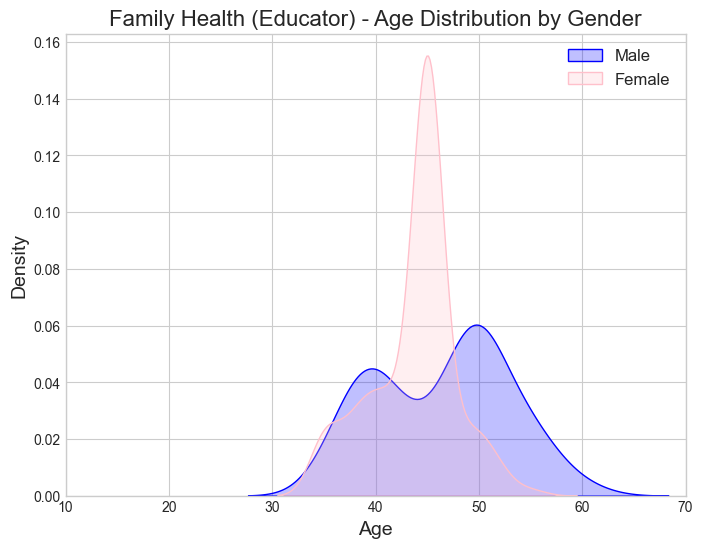

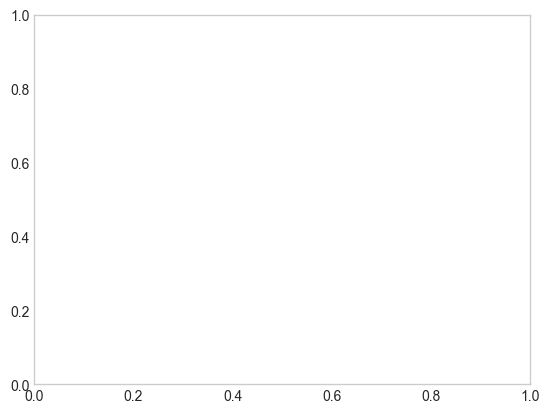

In [31]:
df = pd.concat([dfs[dataset][model].assign(model=model) for model in models], ignore_index=True)
df['Educator Sex'] = df['Educator Sex'].apply(sexHelper.sex2standard)
avg_age_male   = df[df['Educator Sex'] == 'Male']  ['Educator Age']  
avg_age_female = df[df['Educator Sex'] == 'Female']['Educator Age']

plt.figure(figsize=(8, 6))
sns.kdeplot(avg_age_male, shade=True, label='Male', color='blue')
sns.kdeplot(avg_age_female, shade=True, label='Female', color='pink')
plt.xlabel('Age')
plt.ylabel('Density')
plt.title(f'{dataset} (Educator) - Age Distribution by Gender')
plt.grid(True)
plt.legend()
plt.xlim(10, 70)
plt.show()
plt.grid(False)


In [32]:
mean_age_by_sex = pd.concat([educator_df[model].assign(model=model) for model in models], ignore_index=True)
mean_age_by_sex['Educator Sex'] = mean_age_by_sex['Educator Sex'].apply(sexHelper.sex2standard)
mean_ages = mean_age_by_sex.groupby('Educator Sex')['Educator Age'].mean()
print(mean_ages)



Educator Sex
Female     43.775362
Male       46.459016
Unknown    55.000000
Name: Educator Age, dtype: float64


### Educator Age vs. Student Age (by Gender)

In [33]:
# Merge Educator and Student data
merged_df = pd.concat([
    educator_df[model].assign(model=model, 
                               Educator_Sex=educator_df[model]['Educator Sex'].apply(sexHelper.sex2standard))
    .merge(
        student_df[model].assign(model=model, 
                                Student_Sex=student_df[model]['Student Sex'].apply(sexHelper.sex2standard)),
        on=['Batch', '№', 'model'],
        suffixes=('_educator', '_student')
    )
    for model in models
], ignore_index=True)


# Calculate mean Educator age by Educator sex and Student sex
mean_educator_age = merged_df.groupby(['Educator_Sex', 'Student_Sex'])['Educator Age'].mean().round(1)
print("Mean Educator Age by Educator Sex and Student Sex:")
print(mean_educator_age)

# Calculate mean Student age by Educator sex and Student sex
mean_student_age = merged_df.groupby(['Educator_Sex', 'Student_Sex'])['Student Age'].mean().round(1)
print("\nMean Student Age by Educator Sex and Student Sex:")
print(mean_student_age)

Mean Educator Age by Educator Sex and Student Sex:
Educator_Sex  Student_Sex
Female        Female         44.5
              Male           43.5
Male          Female         46.3
              Male           50.0
              Unknown        42.0
Unknown       Female         55.0
Name: Educator Age, dtype: float64

Mean Student Age by Educator Sex and Student Sex:
Educator_Sex  Student_Sex
Female        Female         37.5
              Male           49.0
Male          Female         40.9
              Male           47.8
              Unknown        29.0
Unknown       Female         29.0
Name: Student Age, dtype: float64


### Country of Origin by Race (Map)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


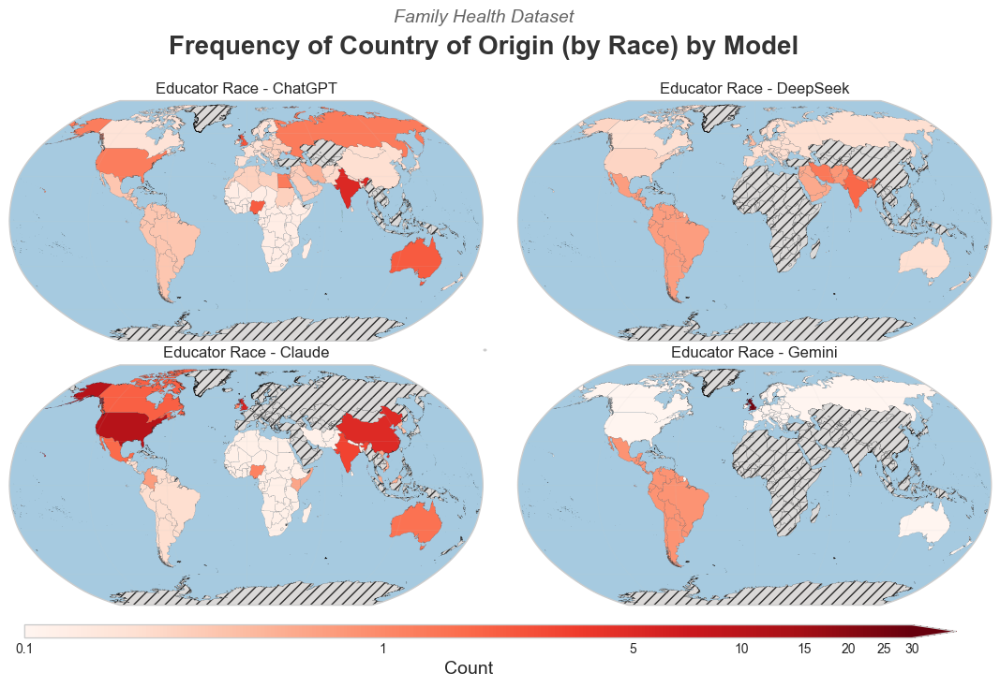

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


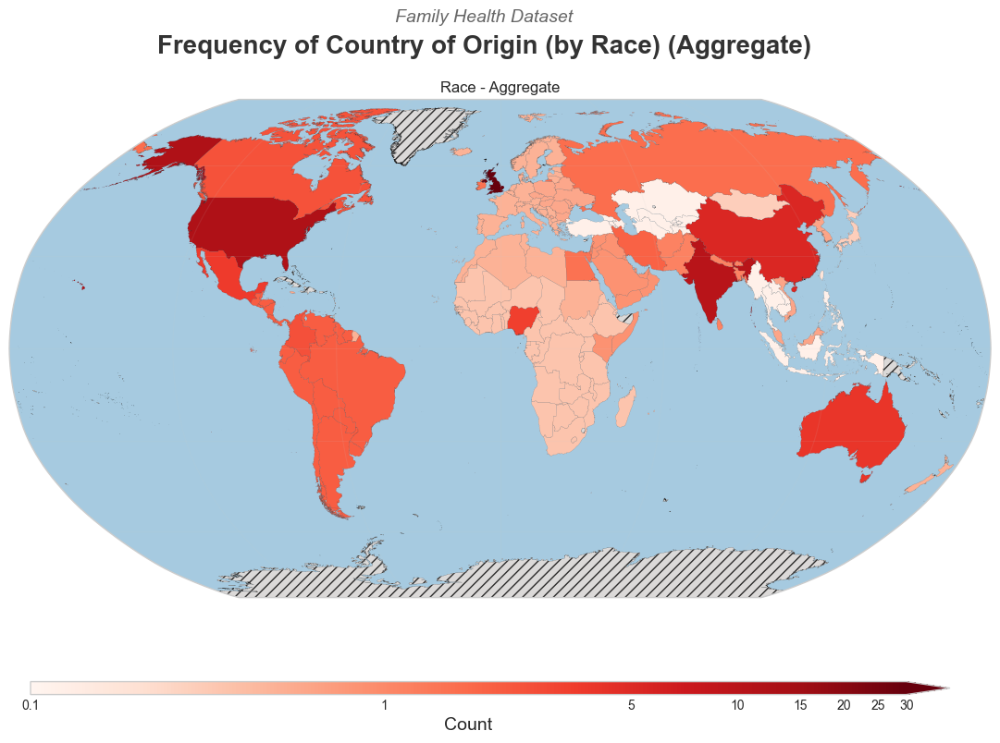

In [34]:
share_legend = True

fig, axs = plt.subplots(2, 2, figsize=(14, 7), squeeze=False,
                        subplot_kw={'projection': ccrs.Robinson()},
                        gridspec_kw={'wspace': 0, 'hspace': 0.1})

for i,model in enumerate(['ChatGPT','Claude','DeepSeek','Gemini']):

    df = educator_df[model].copy()
    df['Educator Country of Residence'] = df['Educator Country of Residence'].apply(countryHelper.fix_country_naming)
    df['Educator Country of Origin'] = df['Educator Race'].apply(countryHelper.race2country)
    
    axs[i%2][i//2] = chizu.draw(
        df=df,x='Educator Country of Origin',
        title=f'Educator Race - {model}',
        cmap='Reds', ax=axs[i%2][i//2],step=5,
        low_poly=False, log=True,
        max_count=30, legend=[0,0,share_legend,0][i],
    )
    
fig.suptitle('Frequency of Country of Origin (by Race) by Model', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country of Origin by Race (Map)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country of Origin by Race (Map).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country of Origin by Race (Map).eps"), format='eps', bbox_inches='tight')
plt.show()

df = pd.concat([educator_df[model].assign(model=model) for model in models], ignore_index=True)

df['Educator Country of Residence'] = df['Educator Country of Residence'].apply(countryHelper.fix_country_naming)
df['Educator Country of Origin'] = df['Educator Race'].apply(countryHelper.race2country)

fig, ax = plt.subplots(figsize=(14, 7), subplot_kw={'projection': ccrs.Robinson()})
ax = chizu.draw(
    df=df,x='Educator Country of Origin',
    title=f'Race - Aggregate',
    cmap='Reds', ax=ax, step=5,
    low_poly=False, log=True,
    max_count=30, legend=True,
    legend_loc=[0,-0.1,0,0]
)

fig.suptitle('Frequency of Country of Origin (by Race) (Aggregate)', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')

plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country of Origin by Race (Map) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country of Origin by Race (Map) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country of Origin by Race (Map) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Country of Origin by Race (Histogram)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:260: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:260: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:260: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:260: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:312: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect

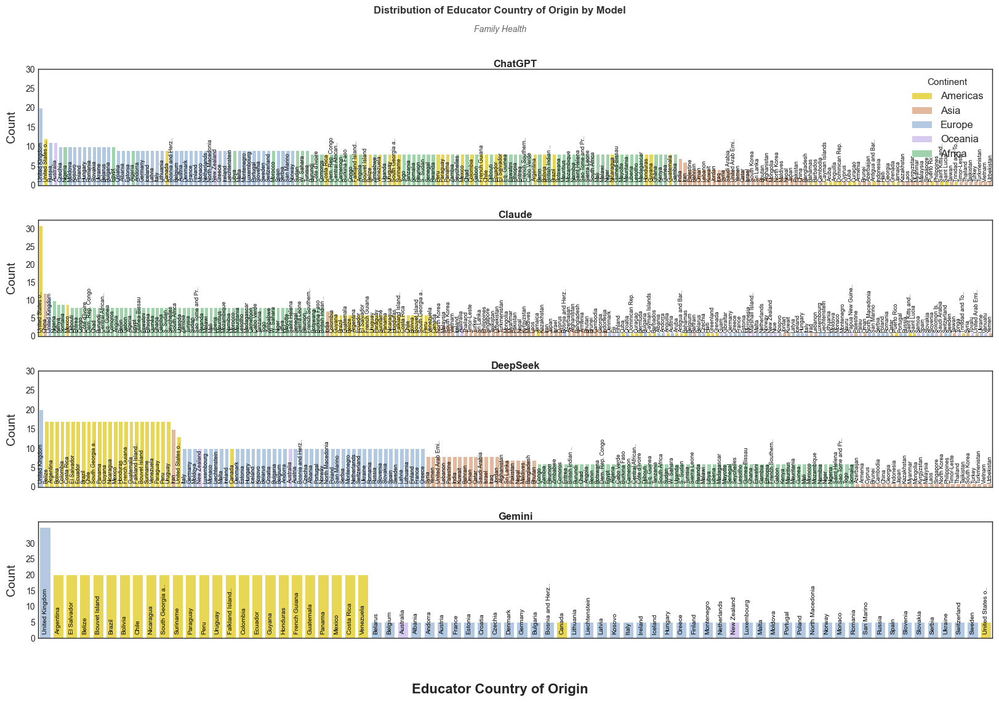

In [35]:
df = pd.concat([educator_df[model].assign(model=model) for model in models], ignore_index=True)
df['Educator Country of Origin'] = df['Educator Race']  \
    .apply(countryHelper.race2country) \
    .apply(countryHelper.fix_country_naming)

df = df[["Educator Country of Origin",'model']]
df = df.explode('Educator Country of Origin')
df['Region'] = df['Educator Country of Origin'].apply(
    lambda country: countryHelper.country2region(country)['subregion']
)
df['Continent'] = df['Educator Country of Origin'].apply(
    lambda country: countryHelper.country2region(country)['region']
)

#TODO: If hue is continet/region, use a map instead of a legend to show the colors
plt = histogram.draw(
    df=df,x='Educator Country of Origin',
    hue='Continent',
    dataset=dataset, ylim=30,ystep=5,
    aggregate=False,long_layout=True,
    xtick_label_max_len=15,
    figsize=(20,12)
)
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country of Origin by Race (Histogram)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country of Origin by Race (Histogram).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country of Origin by Race (Histogram).eps"), format='eps', bbox_inches='tight')
plt.show()

### Country of Residence (Map + Histogram)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


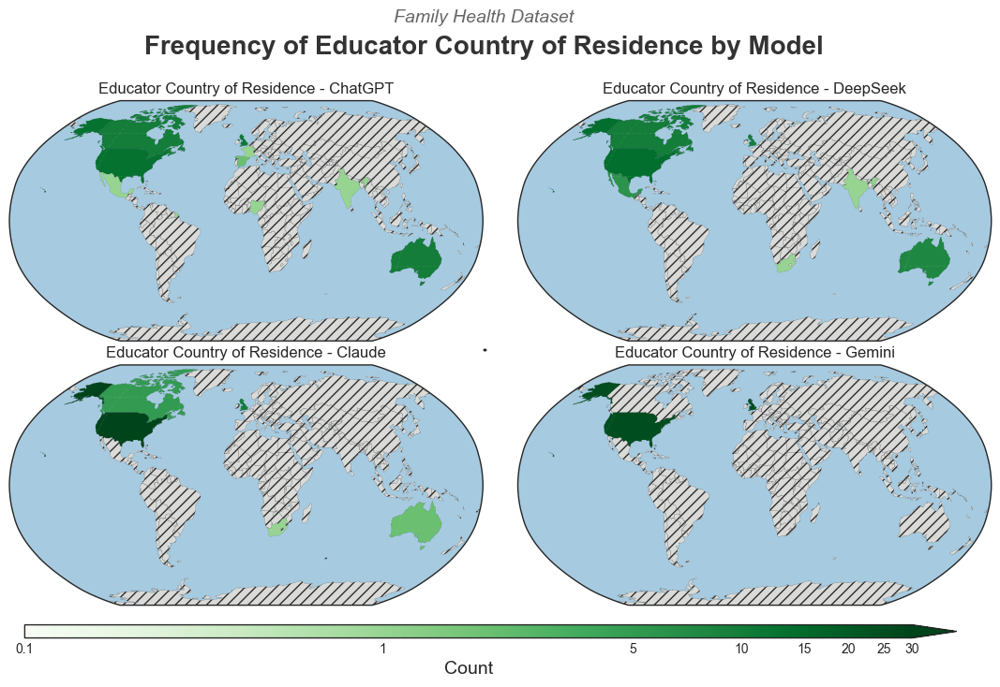

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


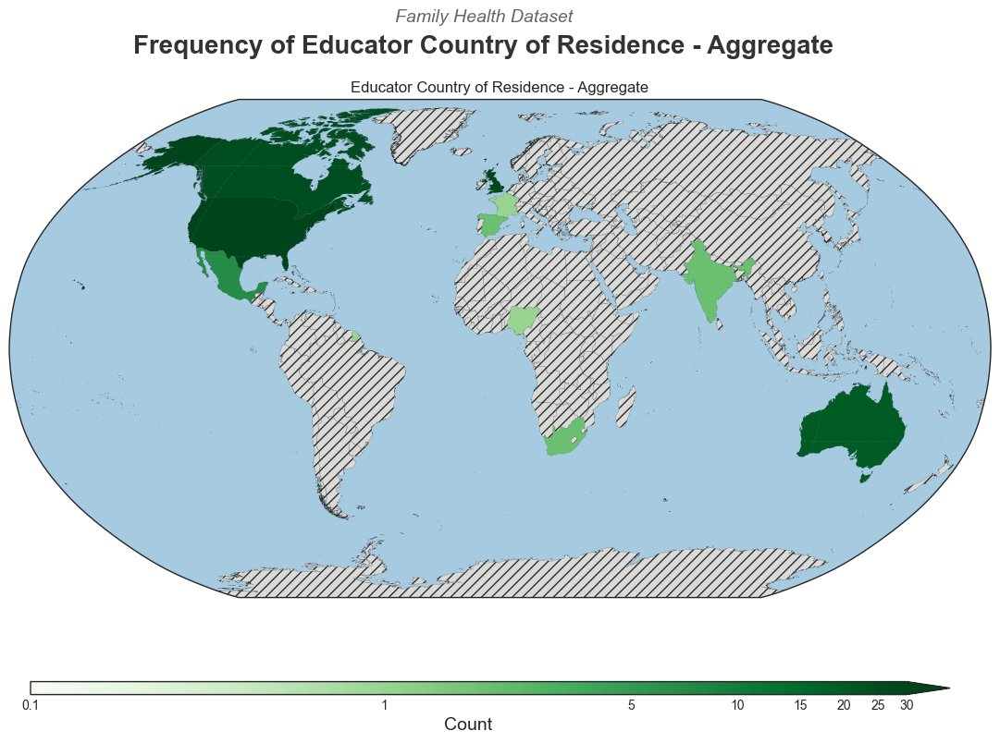

In [36]:
share_legend = True

fig, axs = plt.subplots(2, 2, figsize=(14, 7), squeeze=False,
                        subplot_kw={'projection': ccrs.Robinson()},
                        gridspec_kw={'wspace': 0, 'hspace': 0.1})

for i,model in enumerate(['ChatGPT','Claude','DeepSeek','Gemini']):

    df = educator_df[model]
    df['Educator Country of Residence'] = df['Educator Country of Residence'].apply(countryHelper.fix_country_naming)
    
    axs[i%2][i//2] = chizu.draw(
        df=df,x='Educator Country of Residence',
        title=f'Educator Country of Residence - {model}',
        cmap='Greens', ax=axs[i%2][i//2],
        low_poly=True, log=True, step=5,
        max_count=30, legend=[0,0,share_legend,0][i],
    )

fig.suptitle('Frequency of Educator Country of Residence by Model', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country of Residence (Map)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country of Residence (Map).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country of Residence (Map).eps"), format='eps', bbox_inches='tight')
plt.show()

df = pd.concat([educator_df[model] for model in models], ignore_index=True)
df['Educator Country of Residence'] = df['Educator Country of Residence'].apply(countryHelper.fix_country_naming)

fig, ax = plt.subplots(figsize=(14, 7), subplot_kw={'projection': ccrs.Robinson()})
ax = chizu.draw(
    df=df,x='Educator Country of Residence',
    title=f'Educator Country of Residence - Aggregate',
    cmap='Greens', ax=ax,step=5,
    low_poly=False, log=True,
    max_count=30, legend=True,
    legend_loc=[0,-0.1,0,0]
)
fig.suptitle('Frequency of Educator Country of Residence - Aggregate', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country of Residence (Map) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country of Residence (Map) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country of Residence (Map) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()


c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:312: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


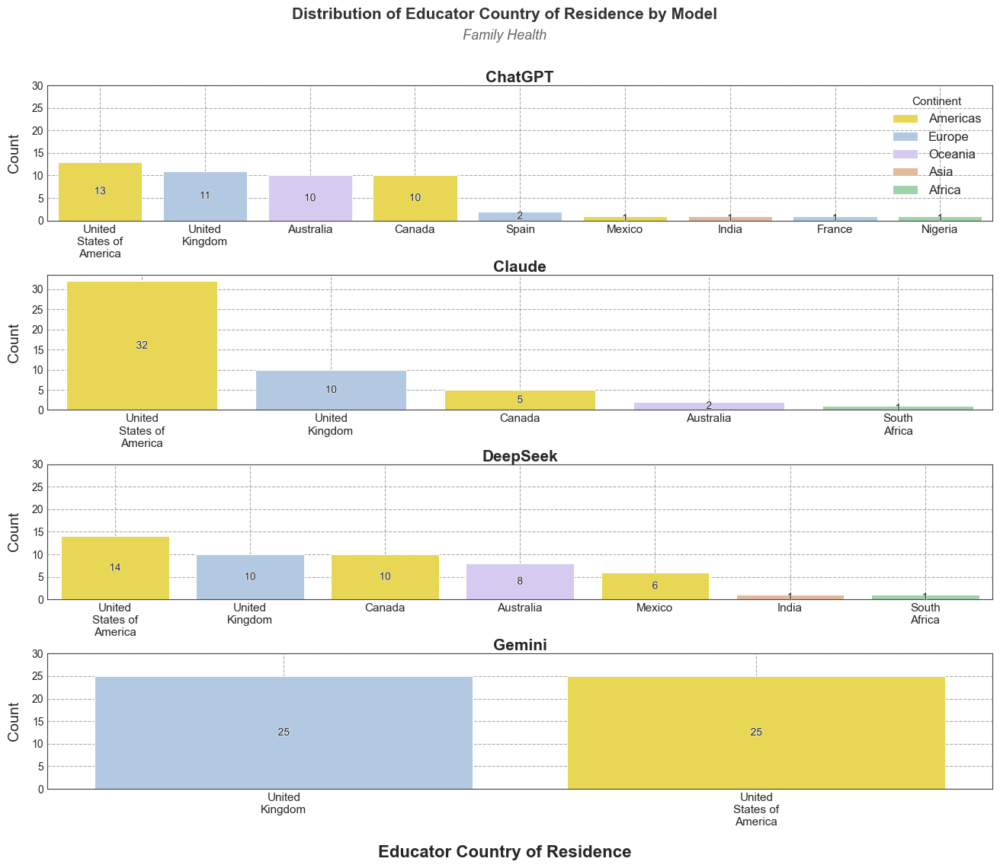

In [37]:
models=['ChatGPT','Claude','DeepSeek','Gemini']
countryHelper = CountryHelper()

df = pd.concat([educator_df[model].assign(model=model) for model in models], ignore_index=True)
df['Educator Country of Residence'] = df['Educator Country of Residence'].apply(countryHelper.country2short)
df['Educator Country of Residence'] = df['Educator Country of Residence'].apply(countryHelper.fix_country_naming)
df['Region'] = df['Educator Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['subregion']
)
df['Continent'] = df['Educator Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['region']
)

plt = histogram.draw(
    df=df,x='Educator Country of Residence',
    hue='Continent', text_width=10, bar_labels=True,
    dataset=dataset, grid=True, ylim=30,ystep=5,
    aggregate=False,long_layout=True, title_size=15,
    figsize=(16,12), rotation=0,hspace=0.4
)
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country of Residence (Histogram)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country of Residence (Histogram).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country of Residence (Histogram).eps"), format='eps', bbox_inches='tight')
plt.show()

### Country Ordering (Stacked)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


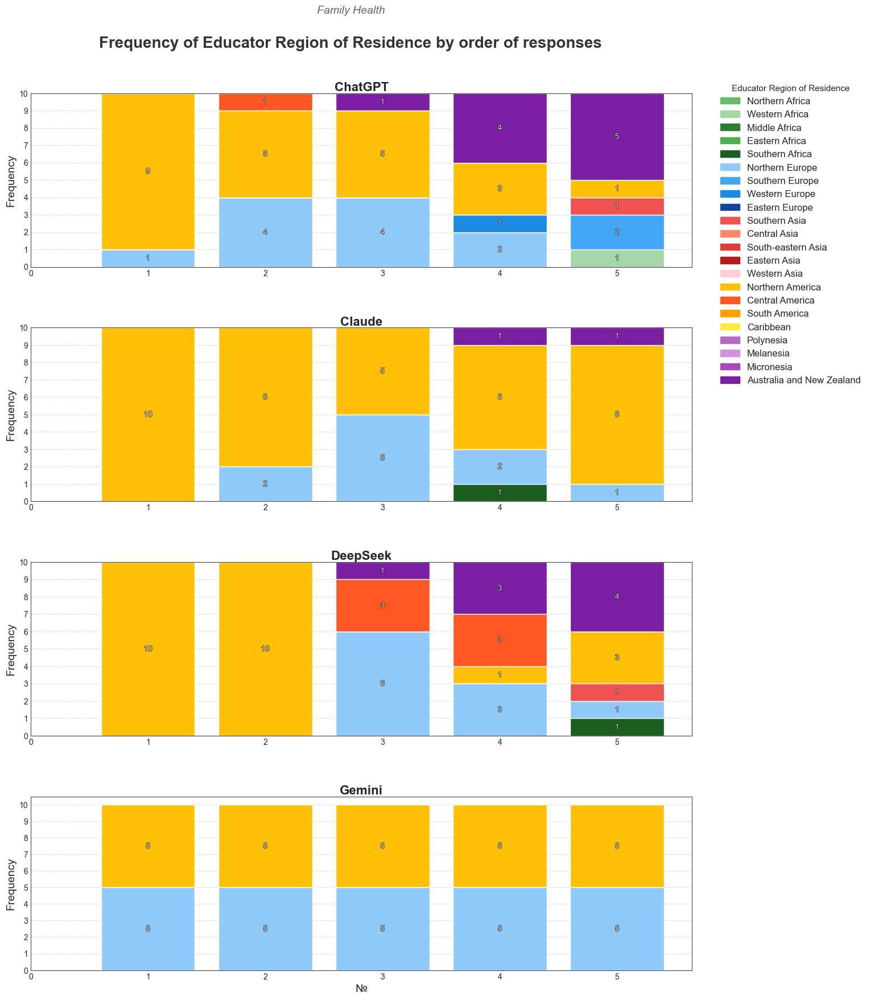

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


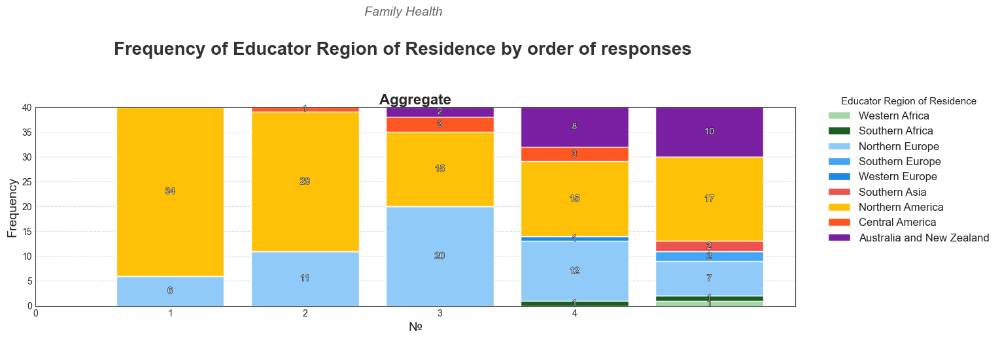

In [38]:
df = pd.concat([educator_df[model].assign(model=model) for model in models], ignore_index=True)
df['Educator Country of Residence'] = df['Educator Country of Residence'].apply(countryHelper.country2short)
df['Educator Country of Residence'] = df['Educator Country of Residence'].apply(countryHelper.fix_country_naming)
df['Educator Region of Residence']  = df['Educator Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['subregion']
)
df['Continent'] = df['Educator Country of Residence'].apply(
    lambda country: countryHelper.country2region(country)['region']
)

plt = stackedBar.draw(
    df=df,x='№',stacked_hue='Educator Region of Residence',
    space=0.35, ylim=10, bar_labels=True, dataset=dataset,
    figsize=(15,20), grid=True, legend=True
)
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country Ordering (Stacked)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country Ordering (Stacked).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country Ordering (Stacked).eps"), format='eps', bbox_inches='tight')
plt.show()

plt = stackedBar.draw(
    df=df,x='№',stacked_hue='Educator Region of Residence', aggregate=True,
    space=0.35, ylim=40, bar_labels=True, dataset=dataset, ystep=5,
    figsize=(15,20), grid=True, legend=True
)
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country Ordering (Stacked) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country Ordering (Stacked) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Country Ordering (Stacked) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Age and Country of Residence

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


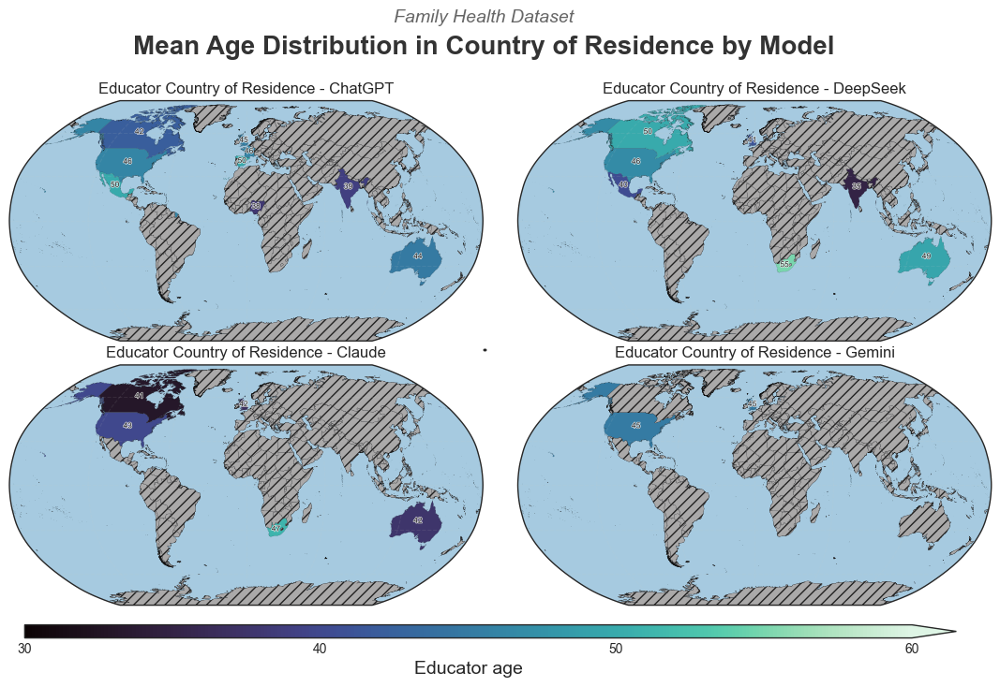

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


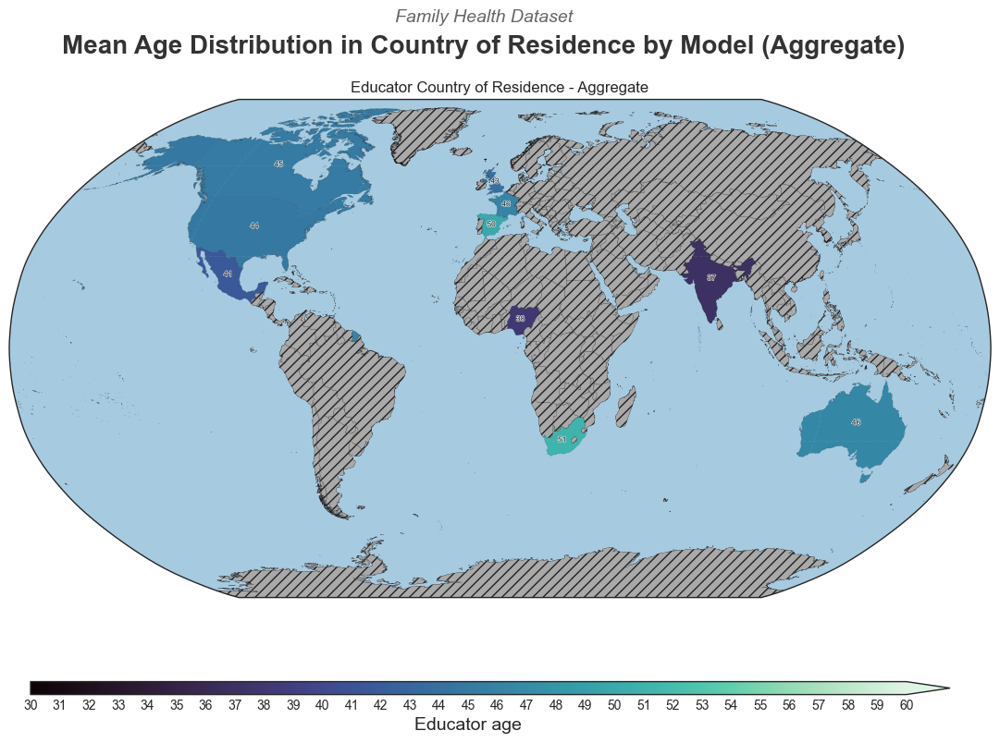

In [39]:
share_legend = True

fig, axs = plt.subplots(2, 2, figsize=(14, 7), squeeze=False,
                        subplot_kw={'projection': ccrs.Robinson()},
                        gridspec_kw={'wspace': 0, 'hspace': 0.1})

for i,model in enumerate(['ChatGPT','Claude','DeepSeek','Gemini']):

    df = educator_df[model]
    df['Educator Country of Residence'] = df['Educator Country of Residence'].apply(countryHelper.fix_country_naming)
    df['Educator Country of Origin'] = df['Educator Race'].apply(countryHelper.race2country) # Note: Using Race for Origin
    
    axs[i%2][i//2] = chizu.draw(
        df=df,x='Educator Country of Residence', y='Educator Age',
        title=f'Educator Country of Residence - {model}', # Title adjusted
        cmap='mako', ax=axs[i%2][i//2], step=10,
        low_poly=False, log=False, show_labels=True,
        max_count=60, legend=[0,0,share_legend,0][i],
    )
    
fig.suptitle('Mean Age Distribution in Country of Residence by Model', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Age and Country of Residence (Map)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Age and Country of Residence (Map).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Age and Country of Residence (Map).eps"), format='eps', bbox_inches='tight')
plt.show()

df = pd.concat([educator_df[model] for model in models], ignore_index=True)
df['Educator Country of Residence'] = df['Educator Country of Residence'].apply(countryHelper.fix_country_naming)
df['Educator Country of Origin'] = df['Educator Race'].apply(countryHelper.race2country) # Note: Using Race for Origin

fig, ax = plt.subplots(figsize=(14, 7), subplot_kw={'projection': ccrs.Robinson()})
ax = chizu.draw(
    df=df,x='Educator Country of Residence',y='Educator Age',
    title=f'Educator Country of Residence - Aggregate',
    cmap='mako', ax=ax, step=1,
    low_poly=False, log=False, show_labels=True,
    max_count=60, legend=True,
    legend_loc=[0,-0.1,0,0]
)
fig.suptitle('Mean Age Distribution in Country of Residence by Model (Aggregate)', 
             fontsize=20, y=0.98, fontweight='bold', color='#333333')
fig.text(0.5, 1, f'{dataset} Dataset', 
         ha='center', fontsize=14, color='#666666', style='italic')
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Age and Country of Residence (Map) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Age and Country of Residence (Map) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Age and Country of Residence (Map) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


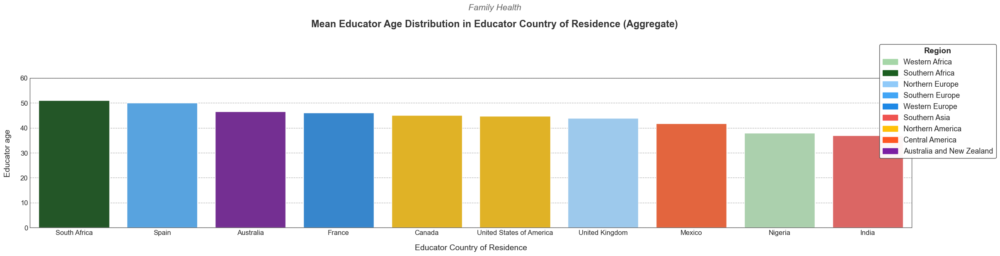

In [40]:
models=['ChatGPT','Claude','DeepSeek','Gemini']
countryHelper = CountryHelper()

df = pd.concat([educator_df[model].assign(model=model) for model in models], ignore_index=True)
df['Educator Country of Residence'] = df['Educator Country of Residence'].apply(countryHelper.country2short)
df['Educator Country of Residence'] = df['Educator Country of Residence'].apply(countryHelper.fix_country_naming)
df['Educator Country of Origin'] = df['Educator Race'].apply(countryHelper.race2country) # Note: Using Race for Origin

df_2 = countryHelper.get_country_average_y(df,x='Educator Country of Residence',y='Educator Age')
df_2['Continent'] = df_2['Educator Country of Residence'].apply(lambda x: countryHelper.country2region(x)['region'])
df_2['Region']    = df_2['Educator Country of Residence'].apply(lambda x: countryHelper.country2region(x)['subregion'])

plt = histogram.draw(
    df=df_2,x='Educator Country of Residence', y='Educator Age',
    hue='Region', ylim=60, ystep=10,
    dataset=f"{dataset}\n\n", aggregate=True,
    long_layout=True, legend=(1.1,1.25),
    title_size=17,rotation=0,
    figsize=(9,9)
)
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Age and Country of Residence (Histogram) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Age and Country of Residence (Histogram) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Age and Country of Residence (Histogram) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Age, Education, Gender (BarChart)

nursing degree msc in psychology doctorate in public health, former physician msc msc doctor of education md and mph msc mph msc doctor of nursing practice msc md, mph Educator Sex


c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:297: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:297: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:297: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#888888')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:297: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax.xaxis.grid(not swarm, linestyle='--', alpha=0.7 if not swarm else 0, color='#8

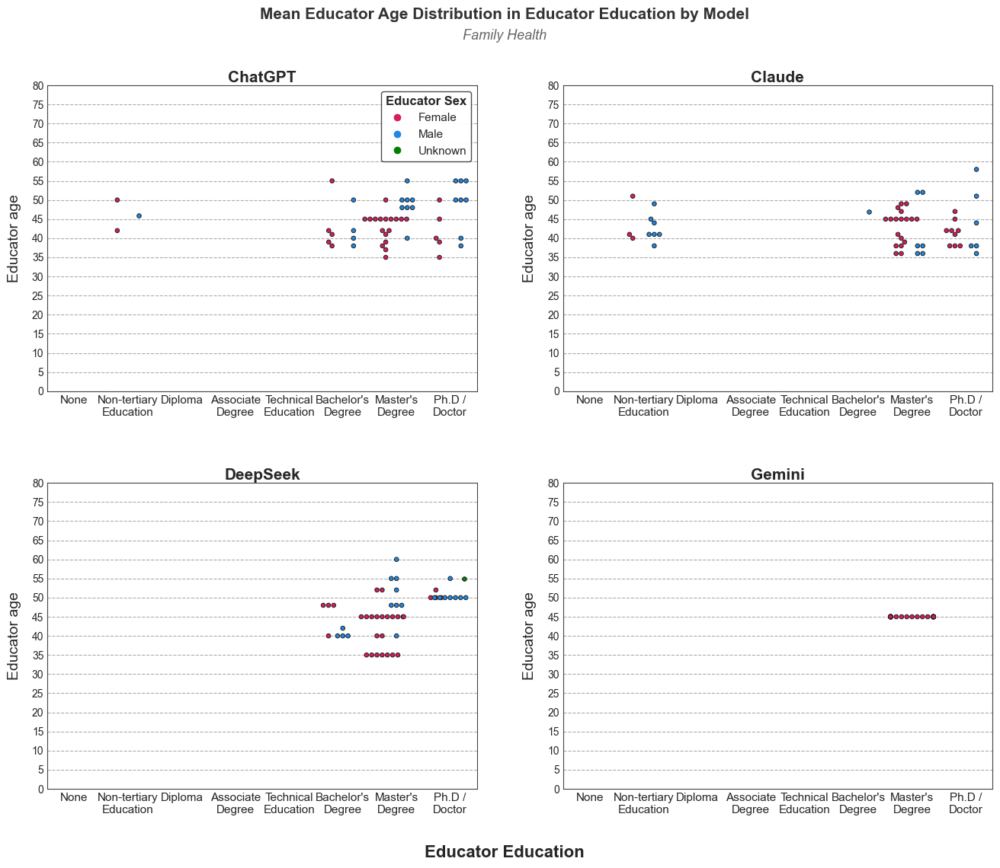

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


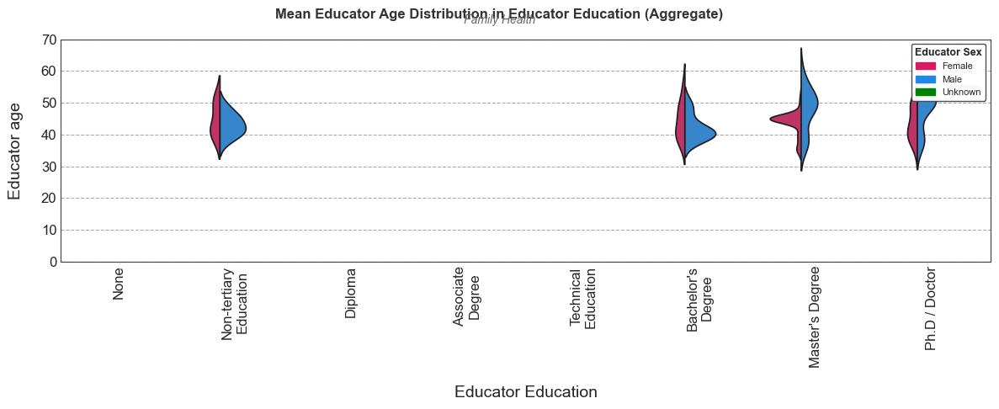

In [41]:
df = pd.concat([educator_df[model].assign(model=model) for model in models], ignore_index=True)
df['Educator Education'] = df['Educator Education'].apply(jobHelper.education2certification)
df['Educator Sex'] = df['Educator Sex'].apply(sexHelper.sex2standard)

plt = histogram.draw(
    df=df,x='Educator Education',
    hue='Educator Sex',y='Educator Age',
    dataset=dataset,legend=(1,1),
    aggregate=False, text_width=12,
    rotation=0, ylim=80, ystep=5, violin=False,swarm=True,
    figsize=(16,12), grid=True, title_size=15
)
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Age Education Gender (BarChart)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Age Education Gender (BarChart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Age Education Gender (BarChart).eps"), format='eps', bbox_inches='tight')
plt.show()

plt = histogram.draw(
    df=df,x='Educator Education',
    hue='Educator Sex',y='Educator Age',
    dataset=dataset, legend = (1,1),
    aggregate=True, text_width=15,
    rotation=90, ylim=70, ystep=10, violin=True,swarm=False,
    figsize=(12,5), grid=True, 
)
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Age Education Gender (BarChart) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Age Education Gender (BarChart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Age Education Gender (BarChart) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Gender (Piechart)

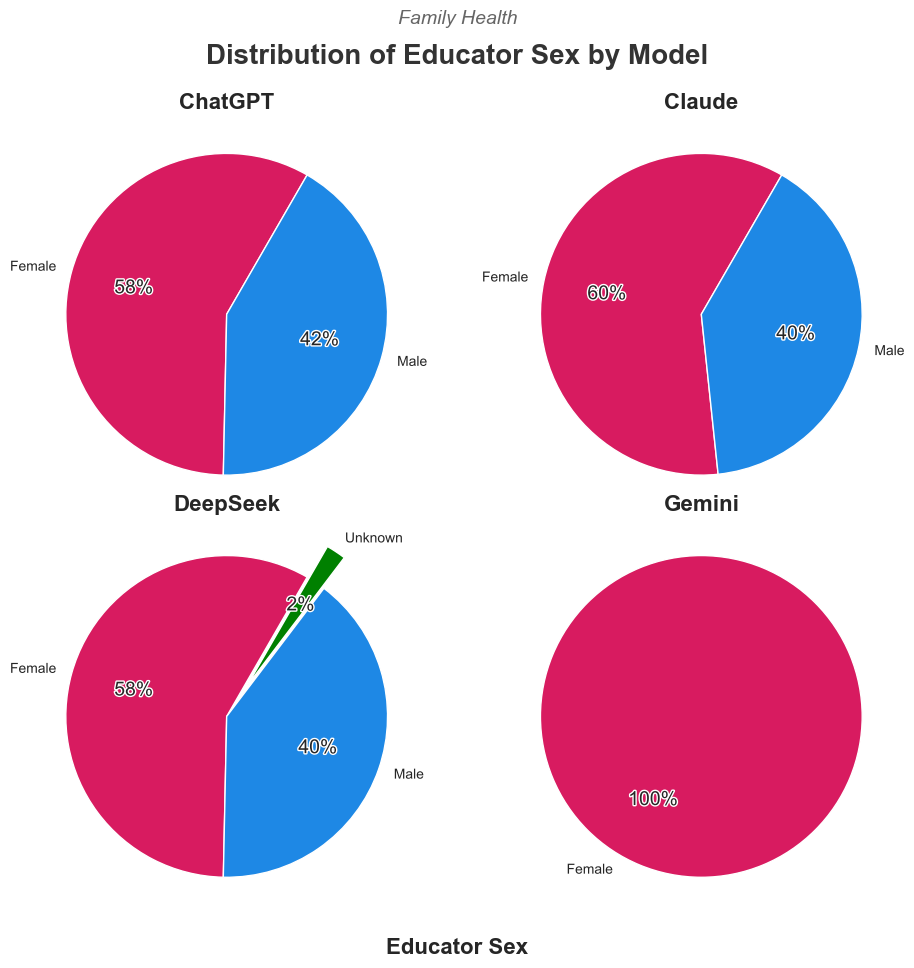

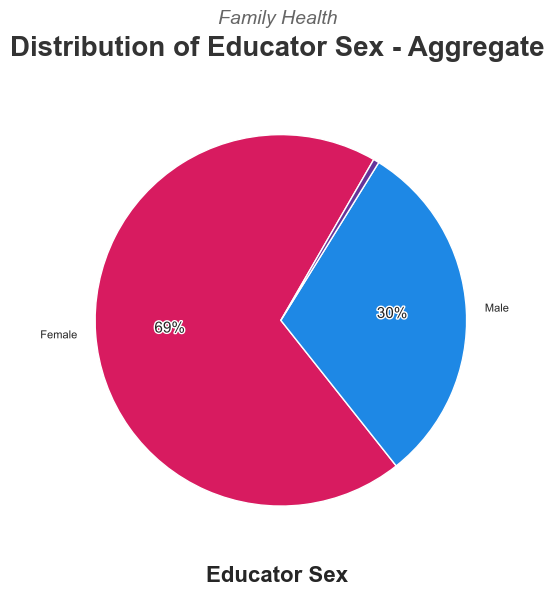

In [42]:
df = pd.concat([educator_df[model].assign(model=model) for model in models], ignore_index=True)
df['Educator Sex'] = df['Educator Sex'].apply(sexHelper.sex2standard)

plt = piechart.draw(
    df, x="Educator Sex",
    dataset=dataset,
    aggregate=False, other=0.00,
    text_width=15, rotation=60,
    figsize=(10,10),space=0,
)
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Gender (Piechart)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Gender (Piechart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Gender (Piechart).eps"), format='eps', bbox_inches='tight')
plt.show()

plt = piechart.draw(
    df, x="Educator Sex",
    dataset=dataset,
    aggregate=True, other=0.04,
    text_width=15, rotation=60,
    figsize=(6,6),space=0,
)
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Gender (Piechart) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Gender (Piechart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Gender (Piechart) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

### Gender and order of responses (Stacked Bar Chart)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


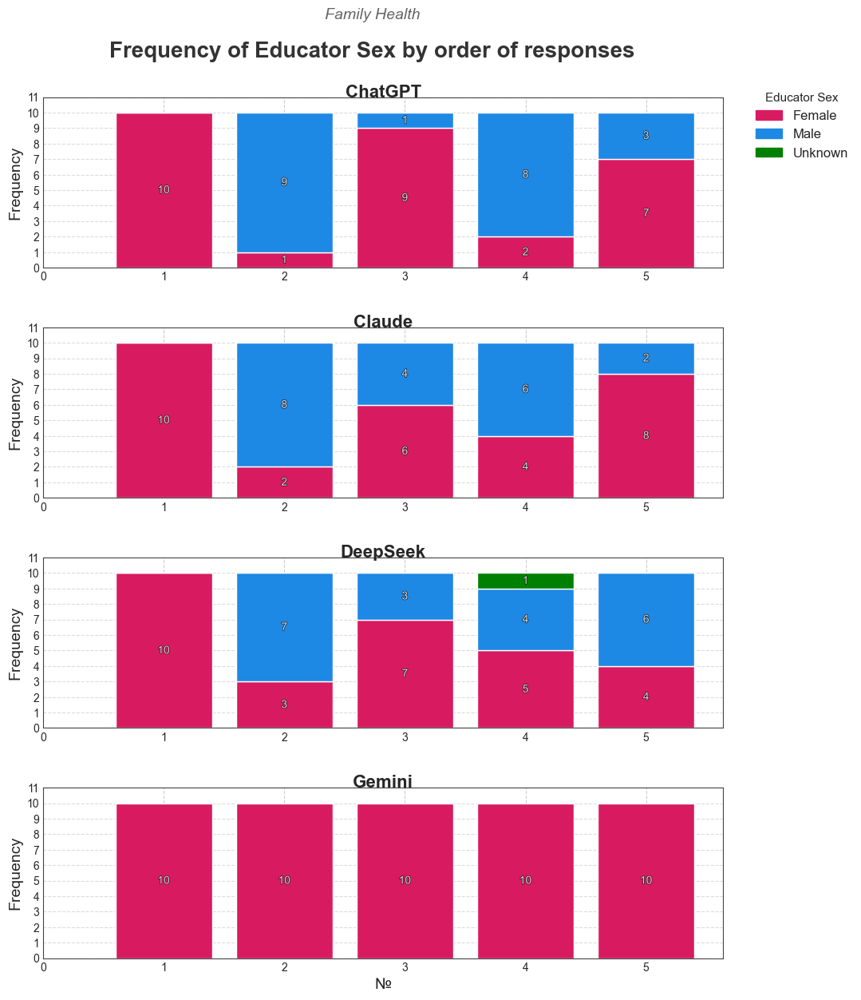

In [43]:
df = pd.concat([educator_df[model].assign(model=model) for model in models], ignore_index=True)
df['Educator Sex']       = df['Educator Sex'].apply(sexHelper.sex2standard)


plt = stackedBar.draw(
    df=df,x='№',stacked_hue='Educator Sex',
    space=0.35, ylim=11, bar_labels=True,
    figsize=(11,14), grid=True,dataset=dataset
)
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Gender and order of responses (Stacked Bar Chart)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Gender and order of responses (Stacked Bar Chart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Gender and order of responses (Stacked Bar Chart).eps"), format='eps', bbox_inches='tight')
plt.show()

### Gender and Education (Stacked Bar Chart)

nursing degree msc in psychology doctorate in public health, former physician msc msc doctor of education md and mph msc mph msc doctor of nursing practice msc md, mph 

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


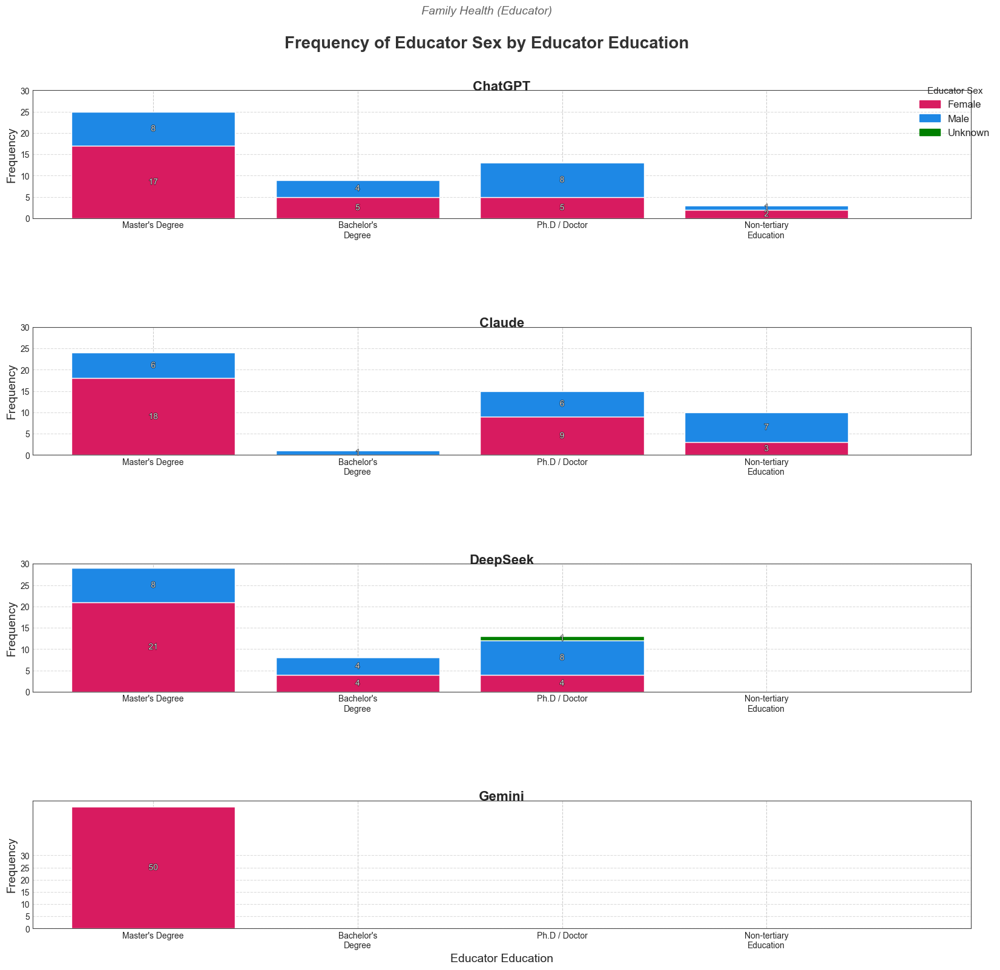

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:871: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.04, 1, 0.94])
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


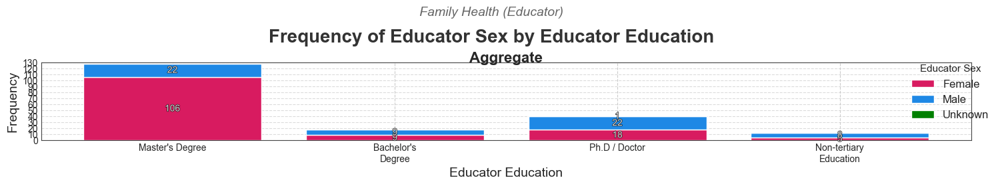

In [44]:
df = pd.concat([educator_df[model].copy().assign(model=model) for model in models], ignore_index=True) # Use .copy()

df['Educator Education'] = df['Educator Education'].apply(jobHelper.education2certification)
df['Educator Sex']       = df['Educator Sex'].apply(sexHelper.sex2standard)

plt = stackedBar.draw(
    df=df,x='Educator Education',stacked_hue='Educator Sex', grid=True,
    aggregate=False, figsize=(20,18), bar_labels=True,
    space=0.85, ylim=30, ystep=5,txt_width=15, dataset=f'{dataset} (Educator)'
)
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Gender and Education (Stacked Bar Chart)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Gender and Education (Stacked Bar Chart).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Gender and Education (Stacked Bar Chart).eps"), format='eps', bbox_inches='tight')
plt.show()


plt = stackedBar.draw(
    df=df,x='Educator Education',stacked_hue='Educator Sex', grid=True, 
    space=0.85, ylim=130, ystep=10, bar_labels=True,
    txt_width=15, figsize=(18,10), aggregate=True,
    dataset=f'{dataset} (Educator)' # Add dataset for aggregate title
)
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Gender and Education (Stacked Bar Chart) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Gender and Education (Stacked Bar Chart) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Gender and Education (Stacked Bar Chart) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()


### Gender and Age (Population Pyramid)

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:580: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = df.groupby([stacked_hue, x,hue]).size().reset_index(name='count')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:618: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(x)[y].sum().reindex(xlabels, fill_value=0)
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:620: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupb

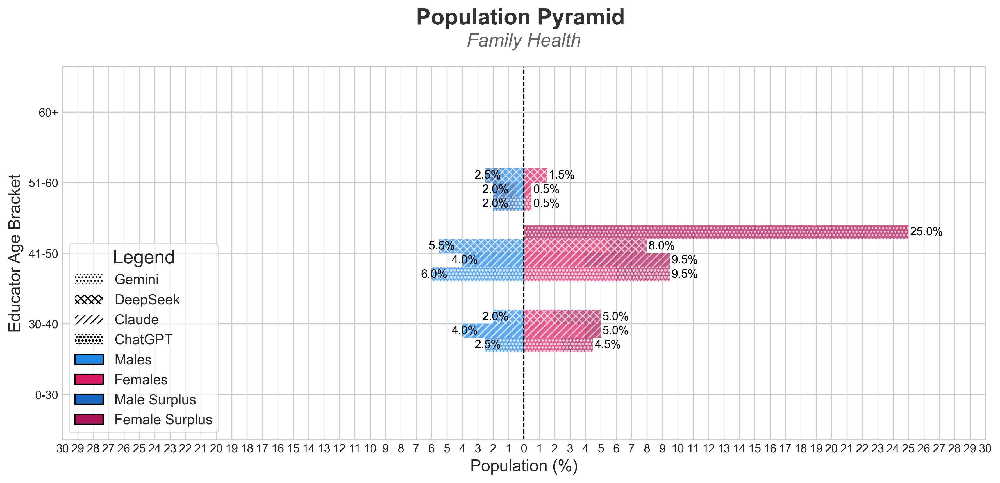

c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:580: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = df.groupby([stacked_hue, x,hue]).size().reset_index(name='count')
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:587: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  males   = df[df[stacked_hue] == 'Male'  ].groupby(x)[y].sum().reindex(xlabels, fill_value=0)
c:\Users\Gabriel_Freeze\Desktop\gender\draw.py:588: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future de

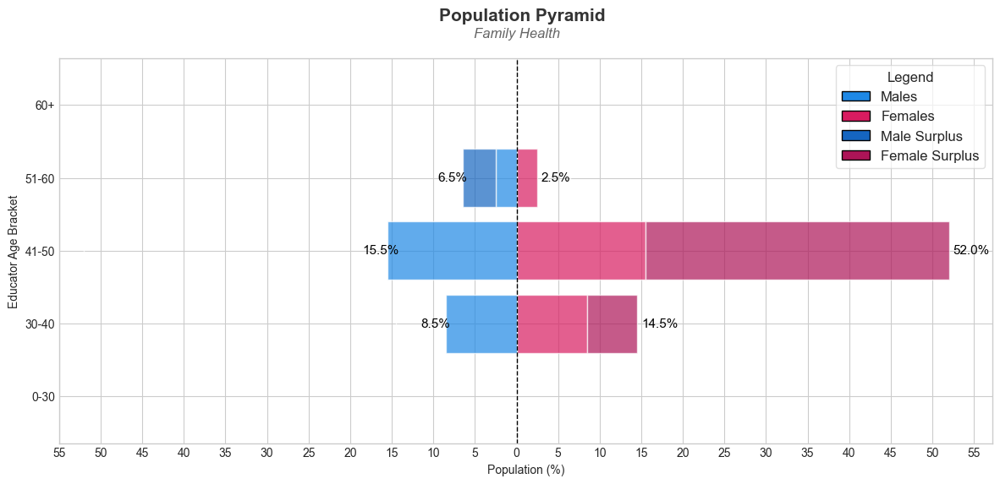

In [45]:
df = pd.concat([educator_df[model].assign(model=model) for model in models], ignore_index=True)
df['Educator Sex'] = df['Educator Sex'].apply(sexHelper.sex2standard)

xlabels = ['0-30', '30-40', '41-50', '51-60', '60+']
df['Educator Age Bracket'] = pd.cut(df['Educator Age'], bins=[0, 30, 40, 50, 60, 100], labels=xlabels)

from draw import PopulationPyramid
pPyramid = PopulationPyramid(models=models)

plt = pPyramid.draw(
    df=df,x='Educator Age Bracket',stacked_hue='Educator Sex',dataset=dataset,
    xlabels=xlabels,aggregate=False, fontsize=14, figsize=(12,6), xlim=30,
)
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Gender and Age (Population Pyramid)"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Gender and Age (Population Pyramid).pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Gender and Age (Population Pyramid).eps"), format='eps', bbox_inches='tight')
plt.show()

plt = pPyramid.draw(
    df=df,x='Educator Age Bracket',stacked_hue='Educator Sex',dataset=dataset,
    xlabels=xlabels,aggregate=True, xlim=55, xstep=5, figsize=(12,6)
)
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Gender and Age (Population Pyramid) - Aggregate"), dpi=300, bbox_inches='tight')
# PGF version
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Gender and Age (Population Pyramid) - Aggregate.pgf"), dpi=300, bbox_inches='tight', format="pgf")
plt.savefig(os.path.join('Case Studies',dataset,'data','educator',f"Educator Gender and Age (Population Pyramid) - Aggregate.eps"), format='eps', bbox_inches='tight')
plt.show()

